# Imports

In [1]:
# --- Standard libs ---
import os, pickle, glob

# --- Scientific stack ---
import numpy as np
import matplotlib.pyplot as plt

# --- Own Code ---
from plot_utils import (
#    decode_obs,
    plot_seeker_obs,
    plot_seeker_trajectory,
#    collect_tree_edges,
    plot_mcts_tree_xy_limited,
    inspect_debug_trace_xy,
    plot_dbg_step,
)

In [2]:
# Create environment for plot info
from rl_competition.competition.environment import create_exploration_seeker

# --- Real environment for rollouts / data collection ---

env, env_config = create_exploration_seeker()
obs, info = env.reset()

# Eval pkl folder

In [3]:
folder = "eval_traces_3D_exploration_temp1"
pkl_files = sorted(glob.glob(os.path.join(folder, "*.pkl")))

pkl_files

['eval_traces_3D_exploration_temp1\\traces_ep000000.pkl']

# Choose file (ep), set seeds list

In [4]:
i = 0  # <- choose index
with open(pkl_files[i], "rb") as f:
    traces = pickle.load(f)
print("Loaded pkl file: ", pkl_files[i])

Loaded pkl file:  eval_traces_3D_exploration_temp1\traces_ep000000.pkl


In [5]:
traces.keys()

dict_keys([1000, 1001, 1002])

In [6]:
seeds = list(traces.keys())

# Length check of all seeds

In [7]:
lengths = []
for s in seeds:
    length = len(traces[s]["states"])
    lengths.append(length)

In [8]:
count = sum(x >= 200 for x in lengths)
print("number of episodes with 200 step count: ", count)

number of episodes with 200 step count:  0


# Choose seed to inspect

In [9]:
seed = seeds[0]
train_iter = traces[seed]["training_iteration"]

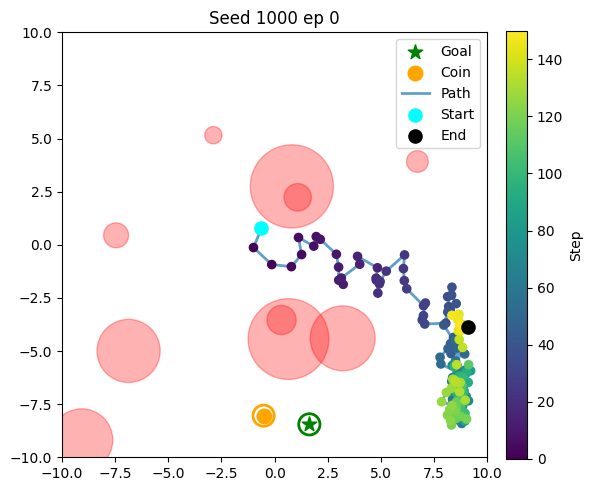

In [10]:
plot_seeker_trajectory(
    traces[seed]["states"],
    num_obstacles=env_config.num_obstacles,
    env=env,
    title=f"Seed {seed} ep {train_iter}",
)

<Axes: >

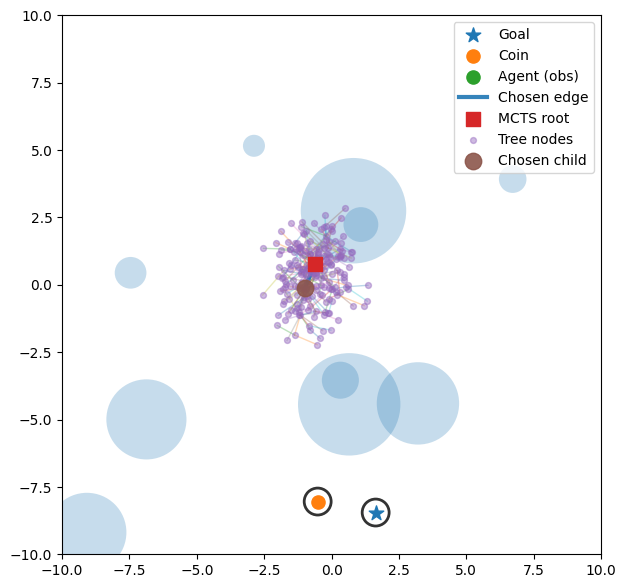

In [11]:
plot_mcts_tree_xy_limited(
    root=traces[seed]["roots"][0],
    num_obstacles=env_config.num_obstacles,
    chosen_child_idx=traces[seed]["chosen_idx"][0],
    max_depth=99,
    top_k_per_node=99,
    L=info.boundary_size if hasattr(info, "boundary_size") else 10,
    goal_radius=getattr(env.unwrapped, "_goal_radius", None),
    coin_radius=getattr(env.unwrapped, "_coin_radius", None),
)

In [12]:
len(traces[seed]["roots"][0].children)

17

In [13]:
sum_ = 0
for child in traces[seed]["roots"][0].children:
    print(child.N_sa)
    sum_ += child.N_sa
print("SUM: ", sum_)

5
1
2
3
4
16
1
1
10
94
7
1
1
1
8
44
1
SUM:  200


In [14]:
sum_c = 0
for child in traces[seed]["roots"][0].children:
    sum_c += len(child.child_node.children)

print("sum children: ", sum_c)

sum children:  66


In [15]:
traces[seed]["roots"][0].children[0].child_node.N

9

In [16]:
traces[seed]["roots"][0].children[0].N_sa

5

In [17]:
root = traces[seed]["roots"][0]
np.sum([int(ch.child_node.is_terminal) for ch in root.children])

0

# Check over all train iterations

In [18]:
import gc

try:
    del traces
except NameError:
    pass
gc.collect()

counts = []
for pkl in pkl_files:
    with open(pkl, "rb") as f:
        traces = pickle.load(f)
    print("pkl loaded: ", pkl)

    lengths = []
    for s in seeds:
        length = len(traces[s]["states"])
        lengths.append(length)
    count = sum([x >= 200 for x in lengths])
    counts.append(count)

pkl loaded:  eval_traces_3D_exploration_temp1\traces_ep000000.pkl


In [19]:
counts

[0]

# Plot tree search of selected SEED

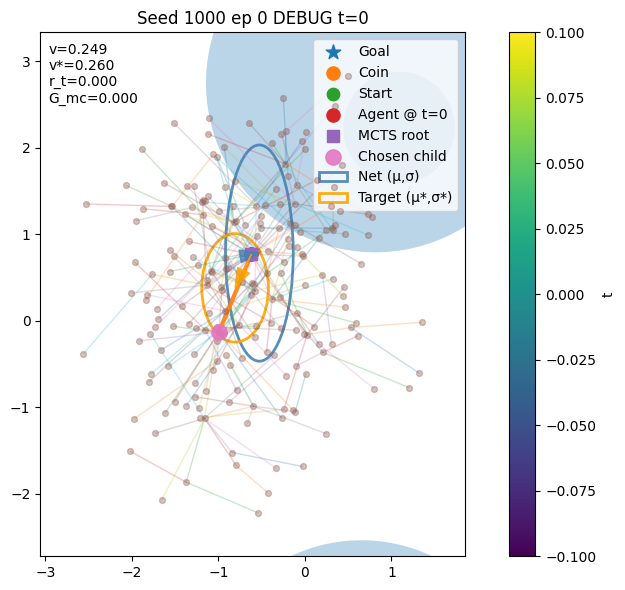

network: (array([0.09245209, 0.01568193, 0.2853384 ], dtype=float32), array([-0.9380088 ,  0.22304697,  0.140055  ], dtype=float32), 0.24875402450561523)
target: (array([-0.18840325, -0.38629198, -0.59808856], dtype=float32), array([-0.9540411 , -0.4666187 , -0.78633165], dtype=float32), 0.2604073422709308)


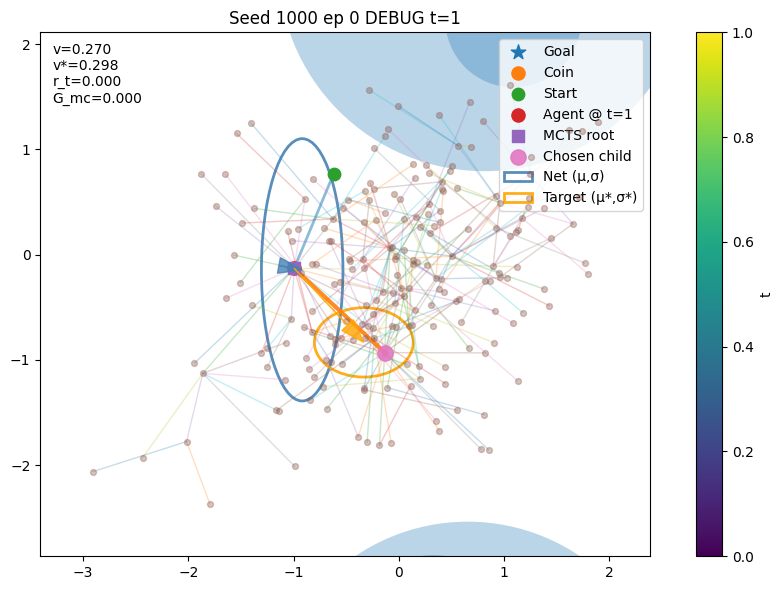

network: (array([ 0.07614988, -0.01418898,  0.2845084 ], dtype=float32), array([-0.9488896 ,  0.2195913 ,  0.11789455], dtype=float32), 0.27002978324890137)
target: (array([ 0.66152525, -0.7031936 , -0.6397969 ], dtype=float32), array([-0.7554469, -1.1101289, -1.0456117], dtype=float32), 0.2975152265407481)


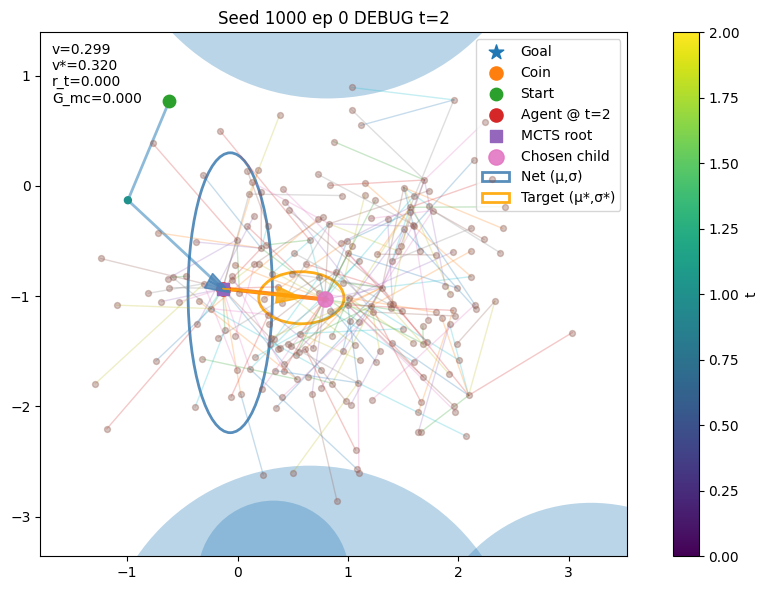

network: (array([ 0.068481  , -0.03813423,  0.2828583 ], dtype=float32), array([-0.9609406 ,  0.23777603,  0.1037145 ], dtype=float32), 0.29879024624824524)
target: (array([ 0.7127028 , -0.08354671, -0.546454  ], dtype=float32), array([-0.9514809, -1.4450701, -0.9953853], dtype=float32), 0.3199448629270813)


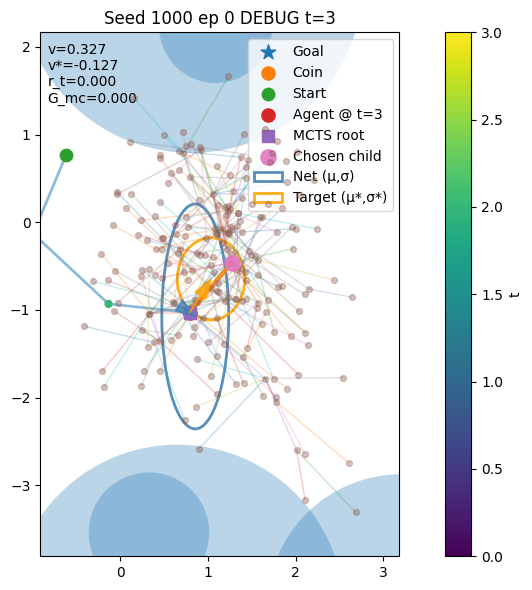

network: (array([ 0.06441189, -0.04394741,  0.27430332], dtype=float32), array([-0.9637644 ,  0.2490439 ,  0.09106094], dtype=float32), 0.32695144414901733)
target: (array([ 0.24527274,  0.38395062, -0.25066054], dtype=float32), array([-0.9535716, -0.7591611, -0.6737213], dtype=float32), -0.12656053079348298)


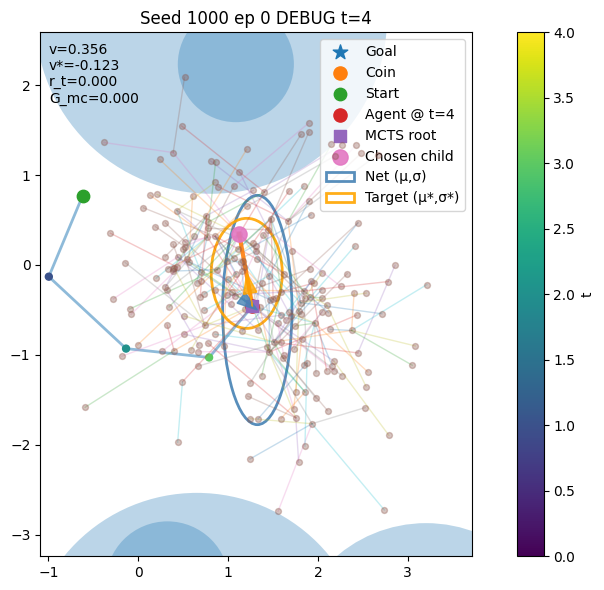

network: (array([ 0.05447442, -0.04114294,  0.25879616], dtype=float32), array([-0.9515104 ,  0.24373664,  0.06792297], dtype=float32), 0.35586804151535034)
target: (array([-0.06307002,  0.36655268, -0.20532206], dtype=float32), array([-0.92772096, -0.49051496, -0.48870942], dtype=float32), -0.12334845346804371)


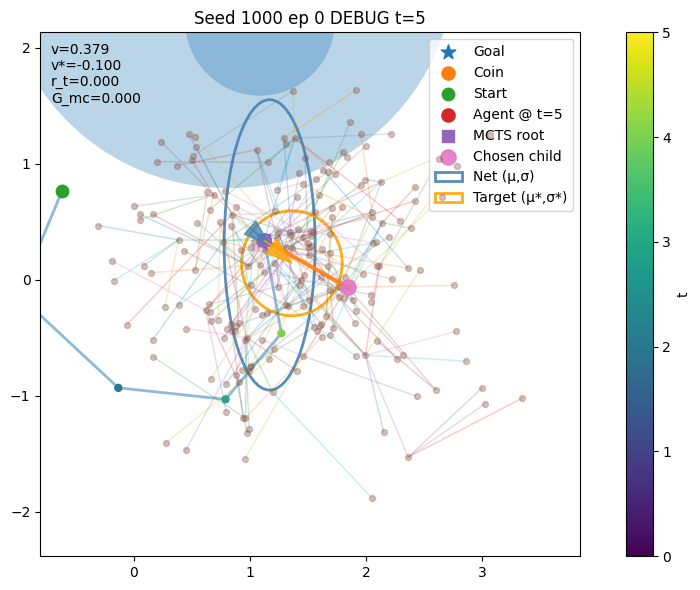

network: (array([ 0.04537636, -0.04002886,  0.24217151], dtype=float32), array([-0.9356177 ,  0.2248206 ,  0.04097398], dtype=float32), 0.3794838488101959)
target: (array([ 0.23688771, -0.19819959, -0.11818171], dtype=float32), array([-0.83485806, -0.7920818 , -0.6946711 ], dtype=float32), -0.09954590354224654)


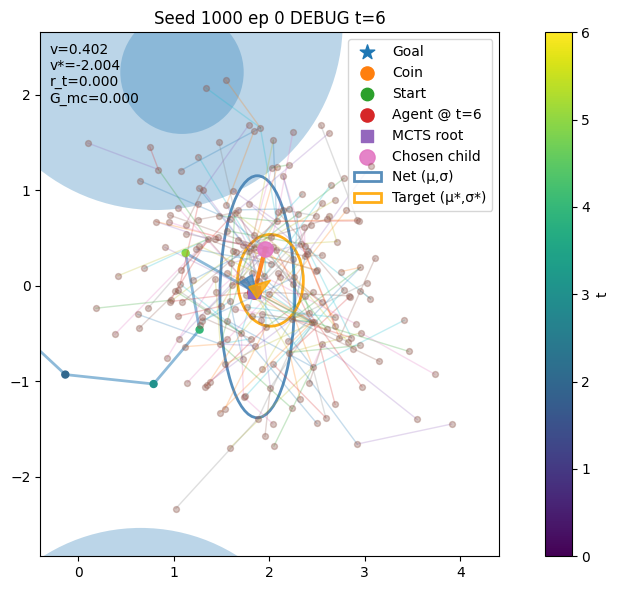

network: (array([ 0.03230653, -0.05254747,  0.24063143], dtype=float32), array([-0.93861806,  0.23651116,  0.03456663], dtype=float32), 0.4016004204750061)
target: (array([ 0.17043443,  0.11947811, -0.03668572], dtype=float32), array([-1.0677344 , -0.7333636 , -0.45517898], dtype=float32), -2.003908699557298)


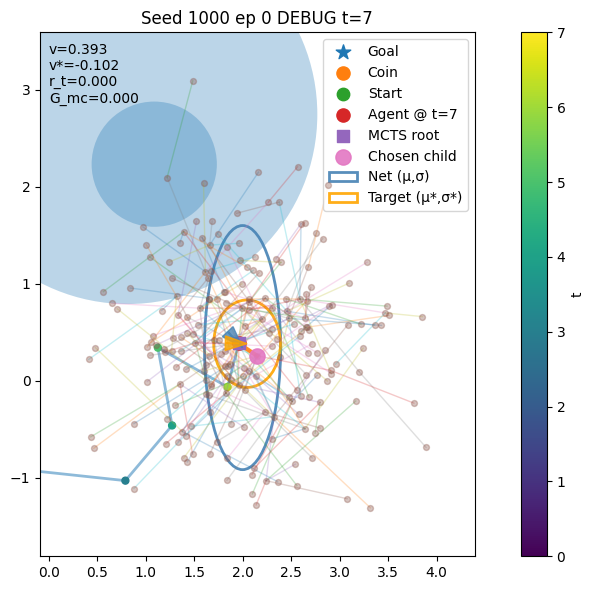

network: (array([ 0.03931927, -0.04230401,  0.24464816], dtype=float32), array([-0.934474  ,  0.23019944,  0.03573073], dtype=float32), 0.3932352662086487)
target: (array([ 0.08596051, -0.00197589, -0.02205478], dtype=float32), array([-1.066441 , -0.796788 , -0.7581277], dtype=float32), -0.1018238524244571)


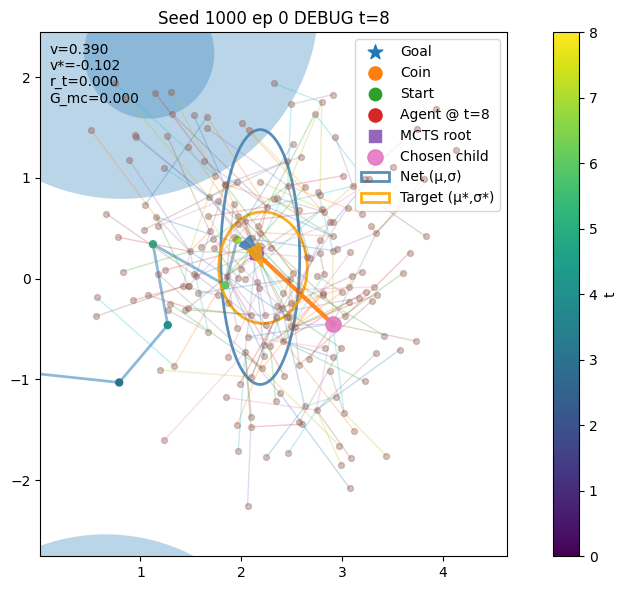

network: (array([ 0.04042296, -0.04247101,  0.24893557], dtype=float32), array([-0.93722713,  0.23458739,  0.04074406], dtype=float32), 0.3900441825389862)
target: (array([ 0.06810441, -0.14774673, -0.21470374], dtype=float32), array([-0.82353556, -0.59219855, -0.68460923], dtype=float32), -0.1017933105712246)


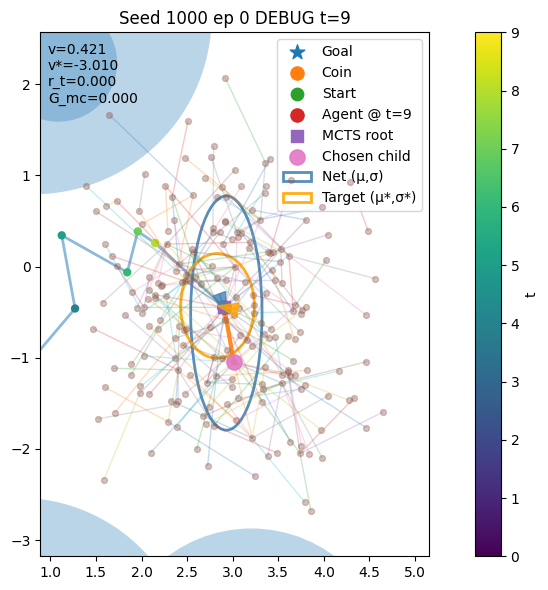

network: (array([ 0.02365368, -0.06393128,  0.24347197], dtype=float32), array([-0.93782103,  0.25037706,  0.03639261], dtype=float32), 0.4205075800418854)
target: (array([-0.07375512,  0.01459858,  0.21510248], dtype=float32), array([-0.90507406, -0.55372864, -0.6823344 ], dtype=float32), -3.009653629683311)


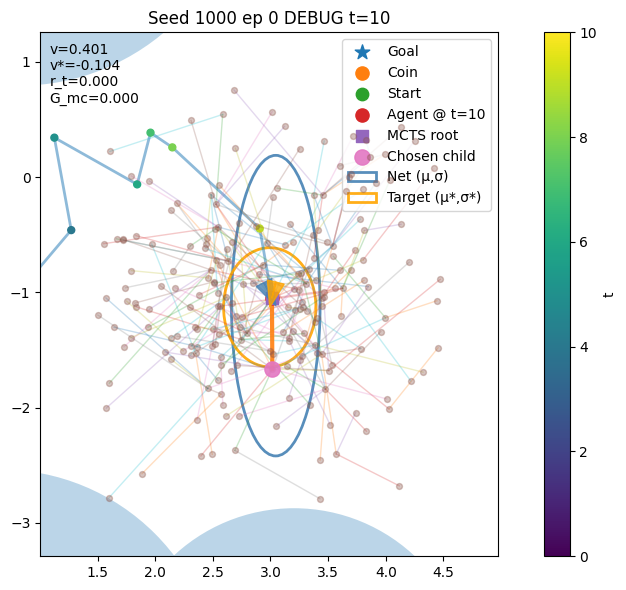

network: (array([ 0.03303054, -0.06470799,  0.26059043], dtype=float32), array([-0.95586455,  0.26540816,  0.05924293], dtype=float32), 0.4014013707637787)
target: (array([-0.01907527, -0.07902733,  0.2078141 ], dtype=float32), array([-0.91505253, -0.6598254 , -0.8196782 ], dtype=float32), -0.10420431731174826)


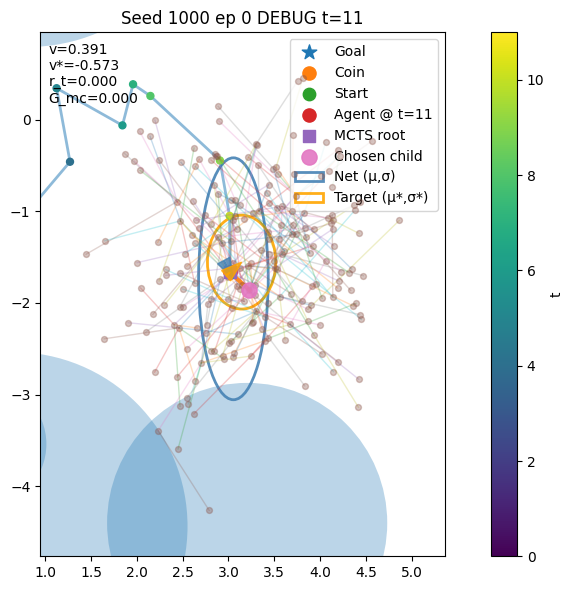

network: (array([ 0.03771261, -0.07068092,  0.26907134], dtype=float32), array([-0.9677353 ,  0.2773487 ,  0.07469786], dtype=float32), 0.39138972759246826)
target: (array([0.12726937, 0.11101221, 0.13931452], dtype=float32), array([-0.9869068 , -0.66939247, -0.6172766 ], dtype=float32), -0.573093062177804)


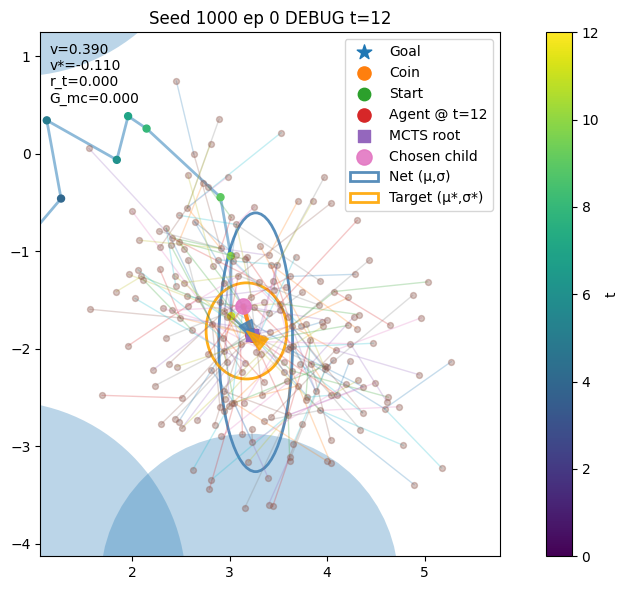

network: (array([ 0.03828034, -0.07248268,  0.27334112], dtype=float32), array([-0.9715425 ,  0.28302544,  0.08001014], dtype=float32), 0.39026206731796265)
target: (array([-0.05594999,  0.04378548,  0.20055705], dtype=float32), array([-0.8812312, -0.7071722, -0.5679522], dtype=float32), -0.10957083484026856)


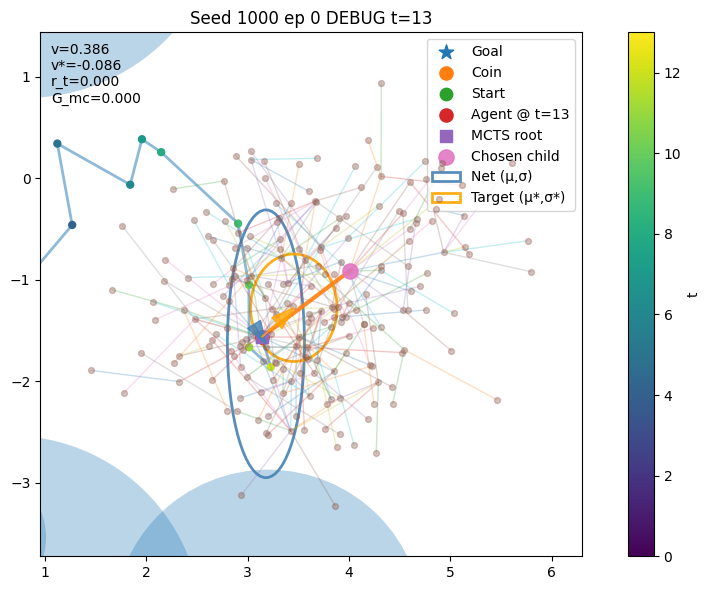

network: (array([ 0.04079119, -0.06646803,  0.27287942], dtype=float32), array([-0.9678228 ,  0.277398  ,  0.07775838], dtype=float32), 0.3861237168312073)
target: (array([ 0.31549   ,  0.28852135, -0.19143513], dtype=float32), array([-0.85303336, -0.6352881 , -0.62884235], dtype=float32), -0.08613435594258739)


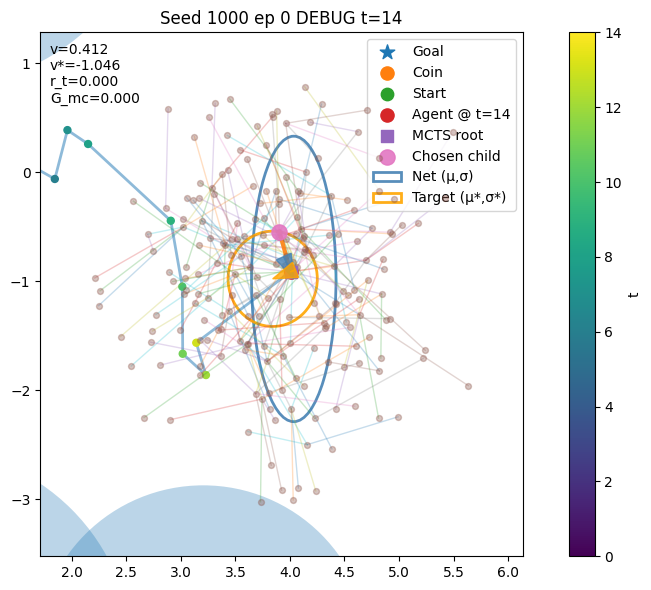

network: (array([ 0.02931247, -0.06537449,  0.26309943], dtype=float32), array([-0.9482211 ,  0.2693147 ,  0.05788118], dtype=float32), 0.4116906225681305)
target: (array([-0.16394173, -0.06434414, -0.03925448], dtype=float32), array([-0.8937245, -0.8278148, -0.4509004], dtype=float32), -1.045550093010253)


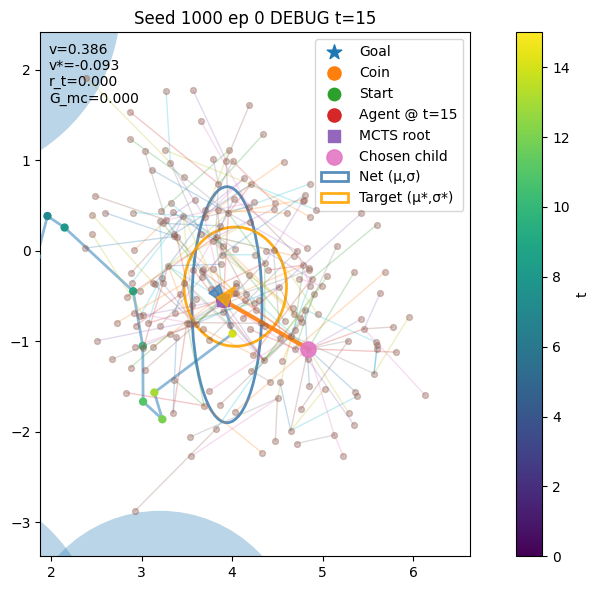

network: (array([ 0.0400487 , -0.0491543 ,  0.27173907], dtype=float32), array([-0.9468906 ,  0.2655627 ,  0.07121059], dtype=float32), 0.3855849802494049)
target: (array([ 0.13225083,  0.15051897, -0.02092831], dtype=float32), array([-0.5688184 , -0.41714263, -0.5911085 ], dtype=float32), -0.09305366836904094)


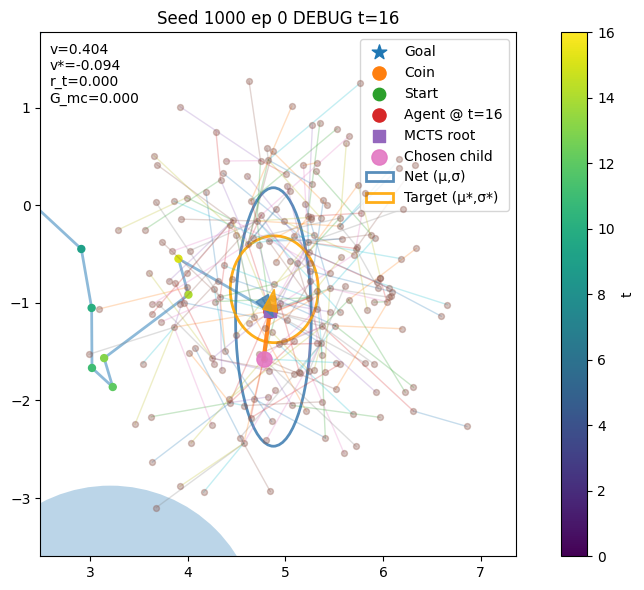

network: (array([ 0.03607656, -0.06019251,  0.2776701 ], dtype=float32), array([-0.9468881 ,  0.2815495 ,  0.07331441], dtype=float32), 0.4044753909111023)
target: (array([ 0.04484801,  0.22412607, -0.06958161], dtype=float32), array([-0.79635316, -0.6020992 , -0.9210495 ], dtype=float32), -0.09449749986186817)


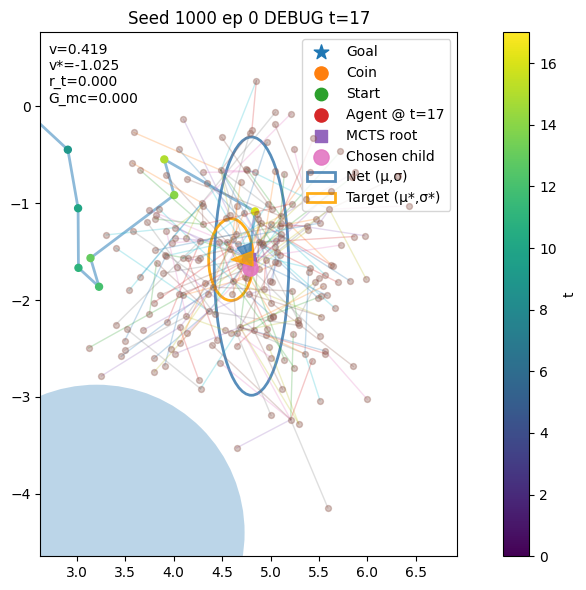

network: (array([ 0.02700214, -0.07555605,  0.27188152], dtype=float32), array([-0.9559448 ,  0.28795648,  0.06935293], dtype=float32), 0.4194844961166382)
target: (array([-0.1842679 , -0.00831332,  0.06929755], dtype=float32), array([-1.4665006 , -0.8611028 , -0.45348492], dtype=float32), -1.0251635825865864)


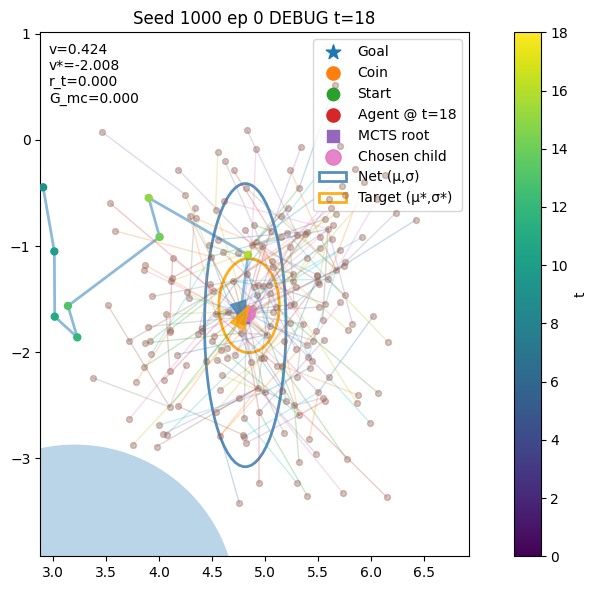

network: (array([ 0.02454456, -0.07895547,  0.27048707], dtype=float32), array([-0.95644295,  0.28931236,  0.06793272], dtype=float32), 0.4236385226249695)
target: (array([ 0.06066998,  0.10558732, -0.00222387], dtype=float32), array([-1.2551783 , -0.81062615, -0.5290909 ], dtype=float32), -2.008041568330879)


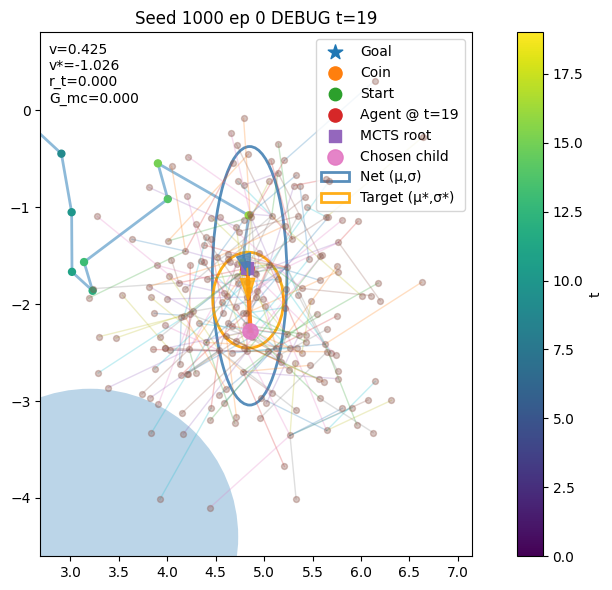

network: (array([ 0.02351328, -0.07929537,  0.26943678], dtype=float32), array([-0.9549953 ,  0.28853863,  0.06626578], dtype=float32), 0.42545968294143677)
target: (array([ 0.00771891, -0.33099777, -0.15422642], dtype=float32), array([-1.0084673, -0.7029087, -0.5845526], dtype=float32), -1.0258795126440812)


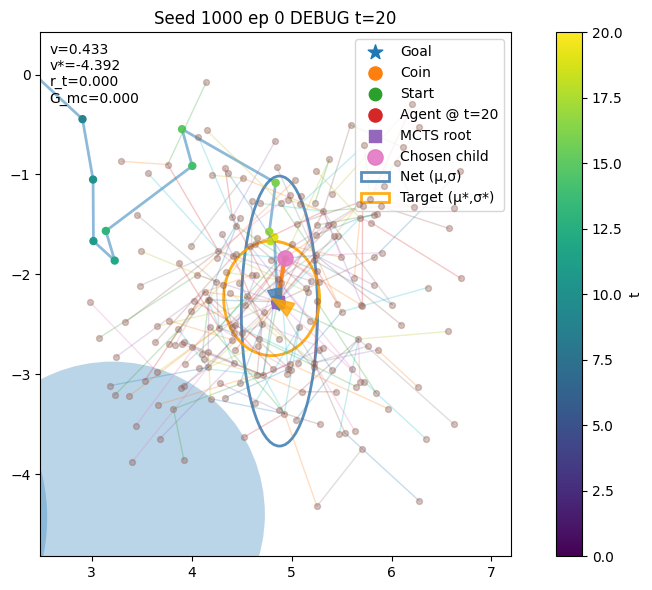

network: (array([ 0.019171  , -0.09213066,  0.27072734], dtype=float32), array([-0.9637928 ,  0.30084062,  0.07040433], dtype=float32), 0.43285802006721497)
target: (array([-0.0593753 ,  0.03570329,  0.11762433], dtype=float32), array([-0.73385113, -0.5555074 , -0.57919645], dtype=float32), -4.392175755331675)


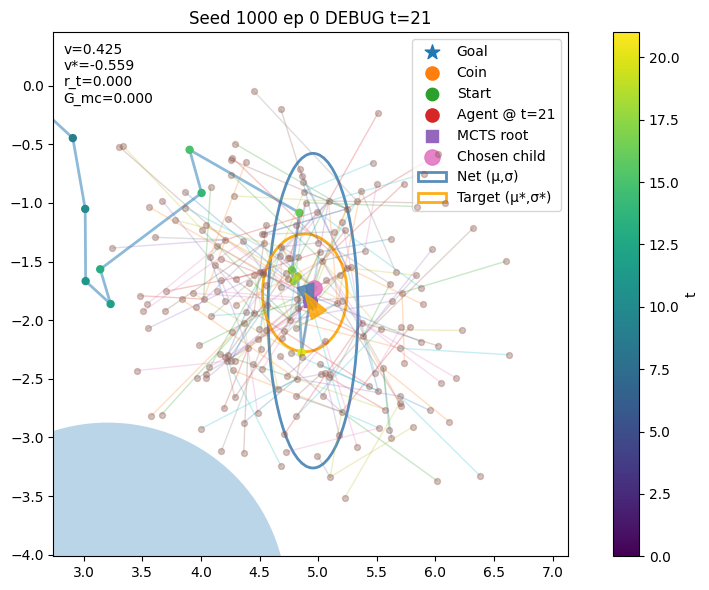

network: (array([ 0.02442378, -0.08149822,  0.2731191 ], dtype=float32), array([-0.9586761 ,  0.29399496,  0.07071159], dtype=float32), 0.42485618591308594)
target: (array([-0.04529488,  0.07084984,  0.11165228], dtype=float32), array([-1.0201358 , -0.6890618 , -0.70365816], dtype=float32), -0.5593082723892978)


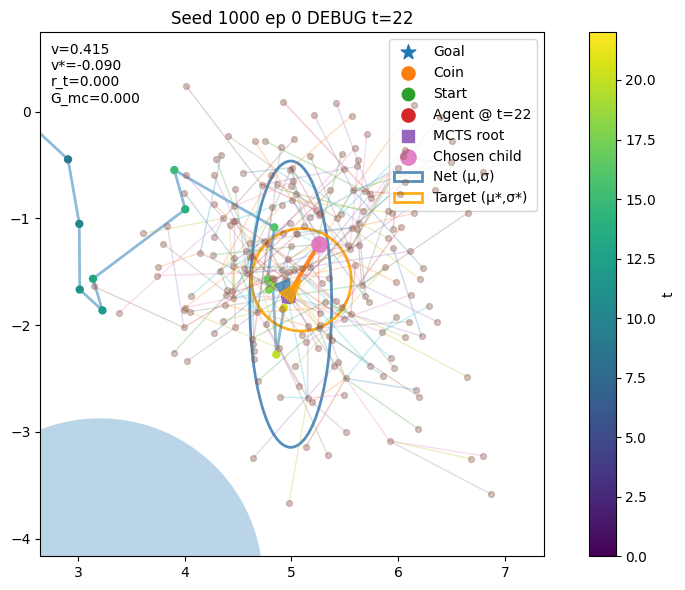

network: (array([ 0.02948298, -0.07536989,  0.27730656], dtype=float32), array([-0.9581641 ,  0.2937888 ,  0.07654158], dtype=float32), 0.41547518968582153)
target: (array([0.12874041, 0.15310545, 0.33167973], dtype=float32), array([-0.760078  , -0.73398507, -0.76970136], dtype=float32), -0.09047328826532369)


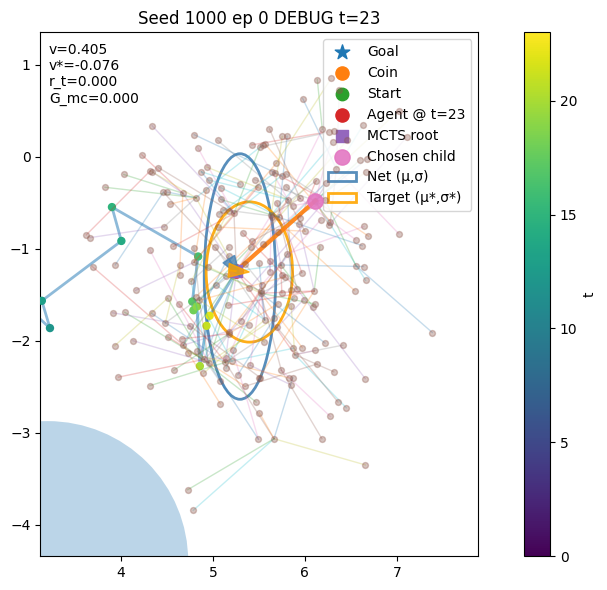

network: (array([ 0.03900262, -0.06051802,  0.28666532], dtype=float32), array([-0.9445703 ,  0.28871542,  0.07662117], dtype=float32), 0.4050043821334839)
target: (array([ 0.14076228, -0.01145223, -0.05256521], dtype=float32), array([-0.7558891 , -0.27132422, -0.6147055 ], dtype=float32), -0.07608778557041834)


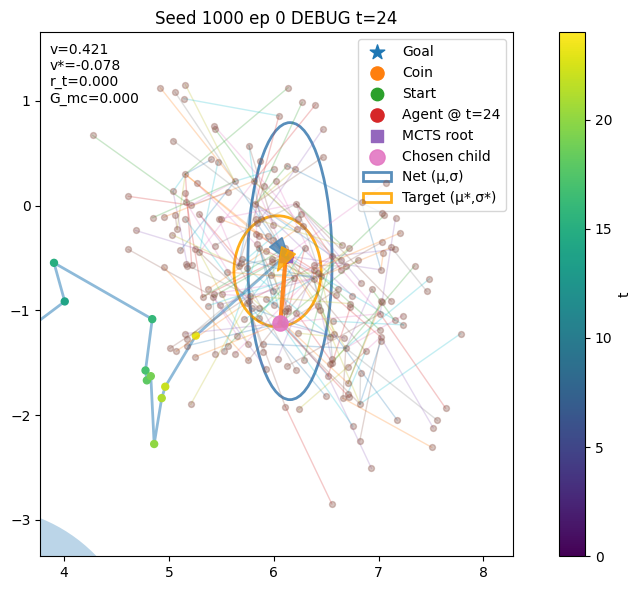

network: (array([ 0.04002541, -0.05311258,  0.2909209 ], dtype=float32), array([-0.9120474 ,  0.27894038,  0.05263618], dtype=float32), 0.42095500230789185)
target: (array([-0.07904192, -0.14981268,  0.04714197], dtype=float32), array([-0.87747115, -0.6363348 , -0.670827  ], dtype=float32), -0.07824258726699528)


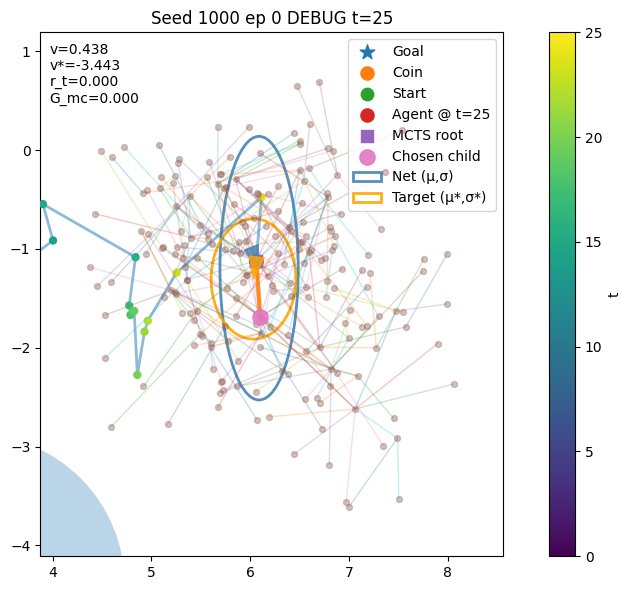

network: (array([ 0.02824358, -0.07364915,  0.28253216], dtype=float32), array([-0.92599475,  0.28810853,  0.05144893], dtype=float32), 0.4383097290992737)
target: (array([-0.02828589, -0.18205145,  0.08351656], dtype=float32), array([-0.8469293, -0.4953263, -0.6863201], dtype=float32), -3.4426180657412133)


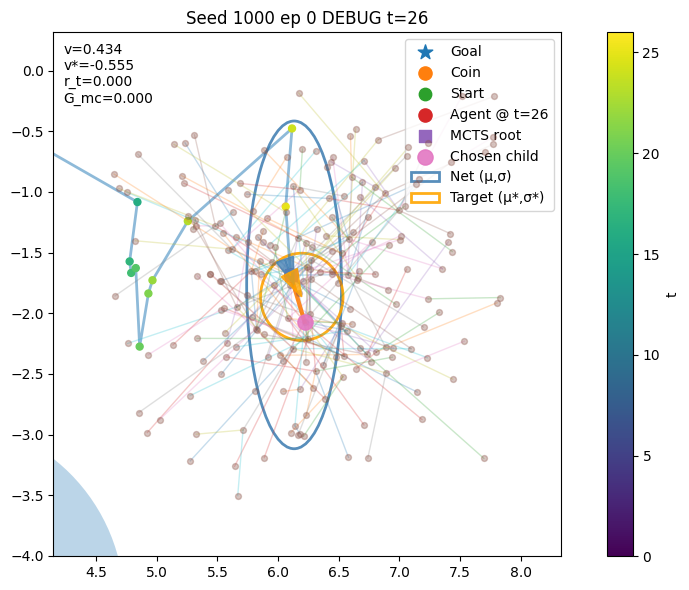

network: (array([ 0.02883476, -0.07970032,  0.28829533], dtype=float32), array([-0.9389914 ,  0.30069655,  0.0647951 ], dtype=float32), 0.4342336356639862)
target: (array([ 0.09206288, -0.17842911,  0.06146514], dtype=float32), array([-1.0787592 , -1.0222001 , -0.66710144], dtype=float32), -0.5546888200289004)


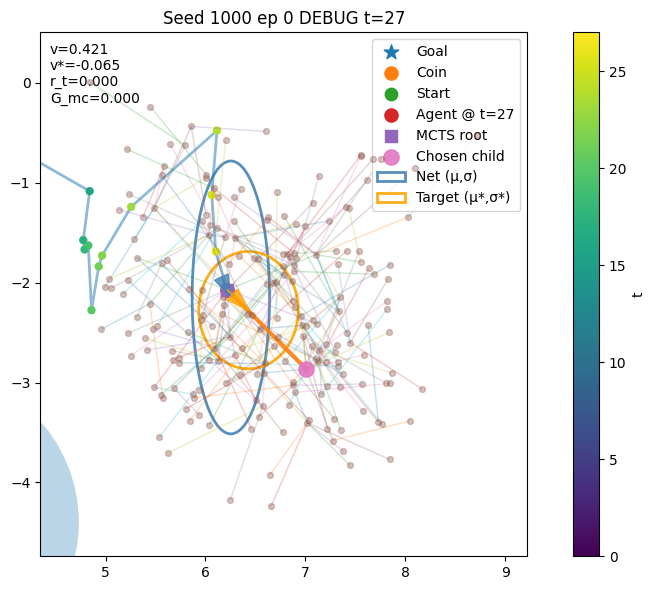

network: (array([ 0.03568099, -0.07732401,  0.30023748], dtype=float32), array([-0.94792163,  0.3119567 ,  0.08153532], dtype=float32), 0.421328604221344)
target: (array([ 0.21290375, -0.20445499,  0.14987402], dtype=float32), array([-0.6973498 , -0.5318955 , -0.61485606], dtype=float32), -0.06503419354588777)


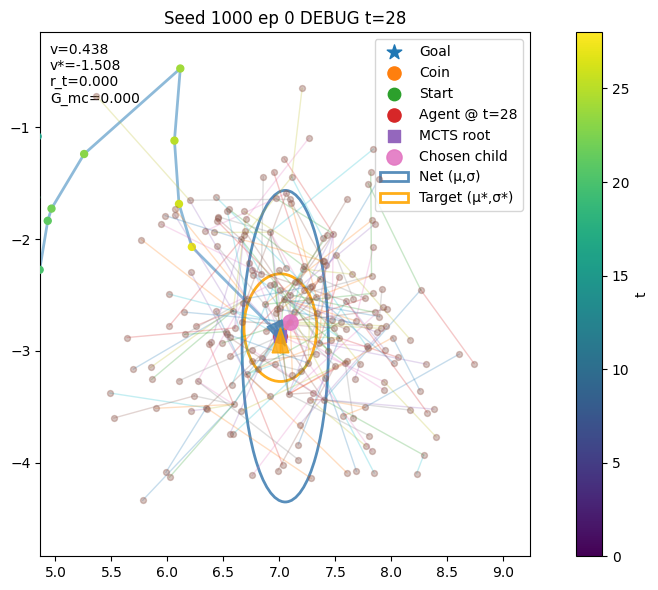

network: (array([ 0.04286836, -0.09155885,  0.3133574 ], dtype=float32), array([-0.9524766 ,  0.33038306,  0.08311973], dtype=float32), 0.43843260407447815)
target: (array([-0.00030842,  0.07390264,  0.10074597], dtype=float32), array([-1.1231227 , -0.7325927 , -0.50274146], dtype=float32), -1.5079475835579947)


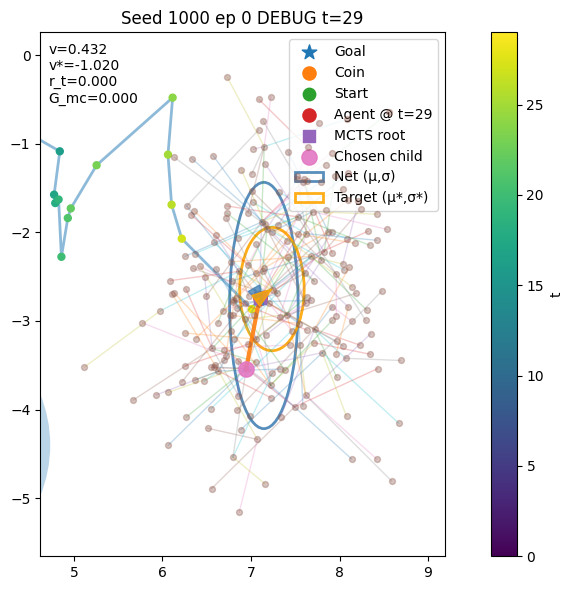

network: (array([ 0.04851496, -0.08465852,  0.3177179 ], dtype=float32), array([-0.94889843,  0.32998425,  0.08624845], dtype=float32), 0.4316185414791107)
target: (array([ 0.13947862,  0.10143532, -0.04552182], dtype=float32), array([-1.0099099 , -0.36122864, -0.56223166], dtype=float32), -1.0196947935479113)


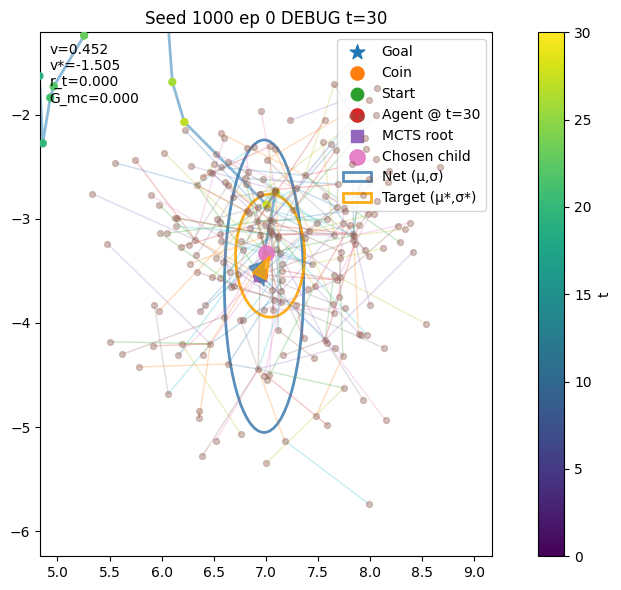

network: (array([ 0.03812016, -0.10920876,  0.30758846], dtype=float32), array([-0.96641076,  0.339639  ,  0.08304531], dtype=float32), 0.4518764317035675)
target: (array([0.0960555 , 0.18417528, 0.5010646 ], dtype=float32), array([-1.1041912 , -0.5265054 , -0.89351326], dtype=float32), -1.5048046721212769)


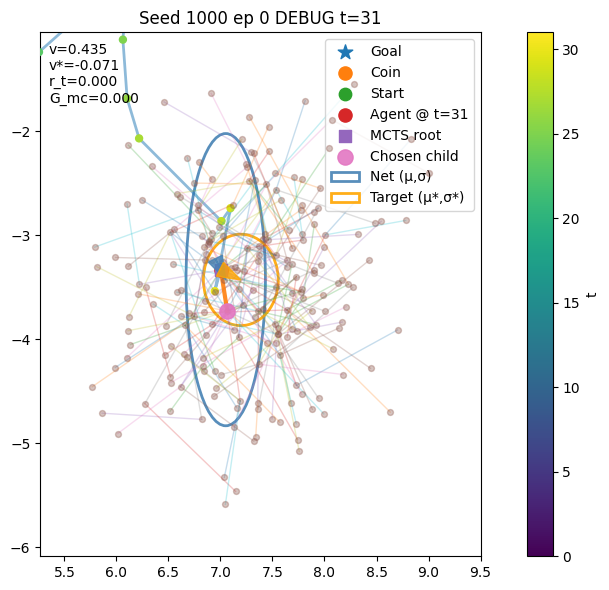

network: (array([ 0.04741414, -0.09561418,  0.31854075], dtype=float32), array([-0.96362007,  0.33950967,  0.09326618], dtype=float32), 0.43525266647338867)
target: (array([ 0.19256543, -0.09800879,  0.3319267 ], dtype=float32), array([-1.0220549, -0.8231595, -0.6006458], dtype=float32), -0.07082273213832908)


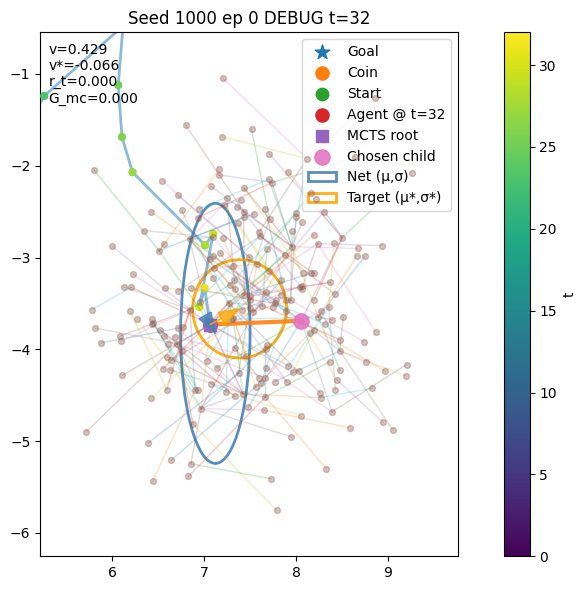

network: (array([ 0.05491385, -0.09620601,  0.326429  ], dtype=float32), array([-0.97248733,  0.34843338,  0.10458741], dtype=float32), 0.42900946736335754)
target: (array([ 0.31944418,  0.17068787, -0.03644627], dtype=float32), array([-0.6698518 , -0.6244754 , -0.55383617], dtype=float32), -0.0655328056608334)


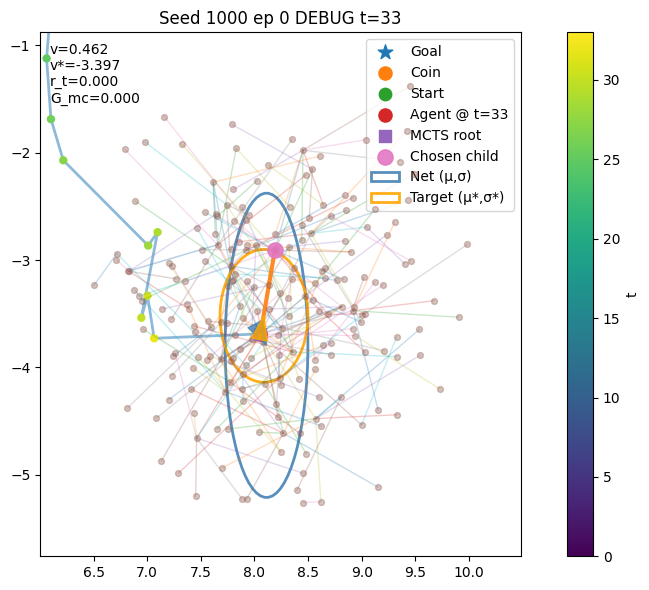

network: (array([ 0.05623158, -0.10651048,  0.3292656 ], dtype=float32), array([-0.9526895 ,  0.34924394,  0.07952357], dtype=float32), 0.4623408913612366)
target: (array([0.03269638, 0.16796845, 0.02133069], dtype=float32), array([-0.8924169 , -0.4795359 , -0.86529195], dtype=float32), -3.397236404321756)


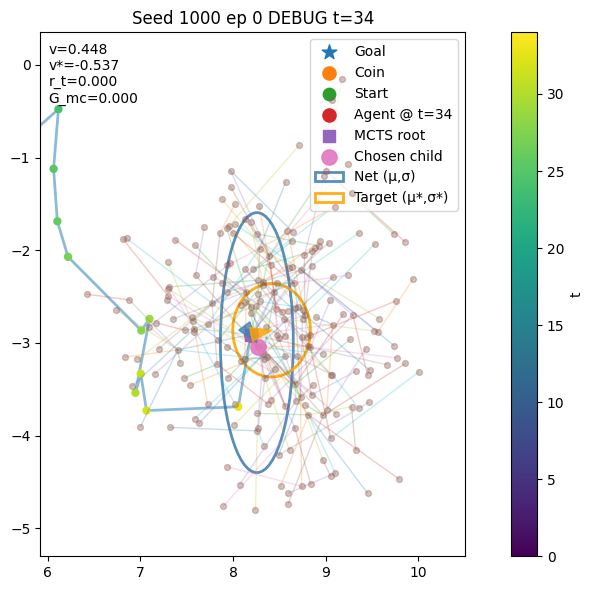

network: (array([ 0.06570973, -0.08712928,  0.3271687 ], dtype=float32), array([-0.93337905,  0.33844483,  0.07679983], dtype=float32), 0.4483288526535034)
target: (array([0.22471869, 0.04580881, 0.25584626], dtype=float32), array([-0.869784 , -0.6855696, -0.583139 ], dtype=float32), -0.5368690485810295)


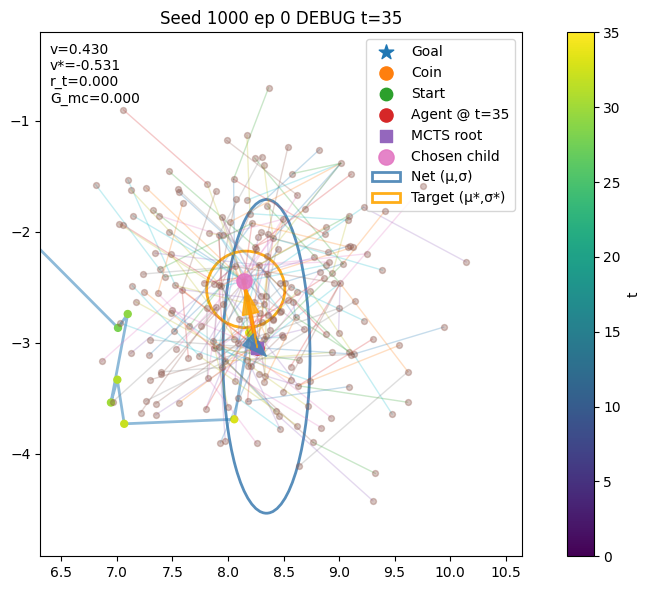

network: (array([ 0.08308828, -0.07842512,  0.33275884], dtype=float32), array([-0.9357352 ,  0.3455009 ,  0.09127077], dtype=float32), 0.43001484870910645)
target: (array([-0.10355037,  0.52460015, -0.19152619], dtype=float32), array([-1.0442314 , -1.0644667 , -0.79196614], dtype=float32), -0.5311221088584306)


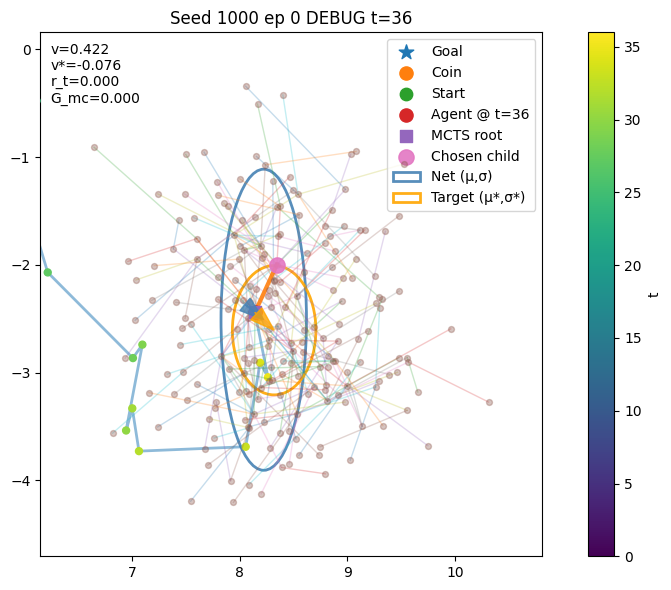

network: (array([ 0.08190736, -0.06740538,  0.32766914], dtype=float32), array([-0.92435837,  0.33489847,  0.08700848], dtype=float32), 0.42189815640449524)
target: (array([ 0.17843147, -0.16480726,  0.05457442], dtype=float32), array([-0.94747216, -0.51035815, -0.8418722 ], dtype=float32), -0.07615658316195381)


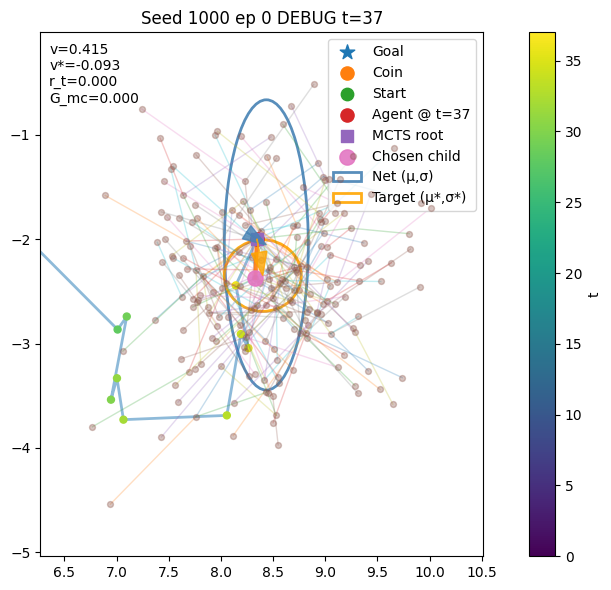

network: (array([ 0.0892273 , -0.05754004,  0.3264252 ], dtype=float32), array([-0.90984786,  0.33024865,  0.08297554], dtype=float32), 0.41540464758872986)
target: (array([ 0.05537098, -0.35126877,  0.11012532], dtype=float32), array([-0.9968551 , -1.0700195 , -0.99481356], dtype=float32), -0.09328485632462784)


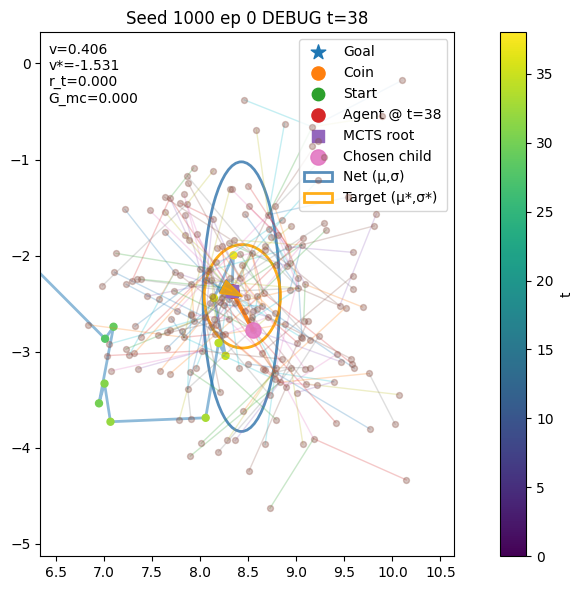

network: (array([ 0.09804948, -0.05686562,  0.3318835 ], dtype=float32), array([-0.91896415,  0.33894914,  0.09577876], dtype=float32), 0.40607738494873047)
target: (array([ 0.10854192, -0.05309039, -0.08670518], dtype=float32), array([-0.92441416, -0.61875594, -0.44912836], dtype=float32), -1.5313522895299732)


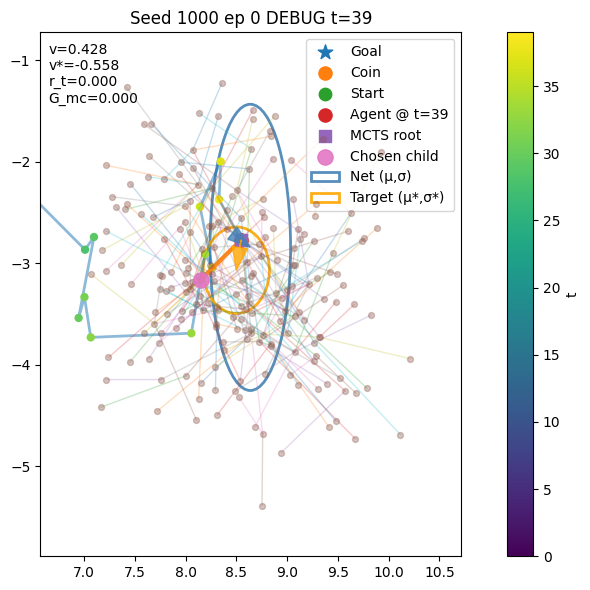

network: (array([ 0.09161767, -0.07307538,  0.33256865], dtype=float32), array([-0.924175  ,  0.3436787 ,  0.08662368], dtype=float32), 0.42823848128318787)
target: (array([-0.04608546, -0.29825178, -0.11941809], dtype=float32), array([-1.120135 , -0.8523646, -0.5010961], dtype=float32), -0.5575003164121777)


In [20]:
n = len(traces[seed]["roots"])

for i in range(min(n, 40)):
    fig, ax = plt.subplots(1, 1, figsize=(12, 6), sharex=True, sharey=True)
    plot_dbg_step(
        traces[seed],
        i,
        num_obstacles=env_config.num_obstacles,
        ax=ax,
        max_depth=99,
        top_k_per_node=99,
        title=f"Seed {seed} ep {train_iter} DEBUG t={i}"
    )
    plt.tight_layout()
    plt.show()
    print("network:", traces[seed]["network_outputs"][i])
    print("target:", traces[seed]["targets_from_root"][i])

# Load last training ep pkl

In [21]:
try:
    del traces
except NameError:
    pass
gc.collect()

with open(pkl_files[-1], "rb") as f:
    traces = pickle.load(f)
print("pkl loaded: ", pkl_files[-1])

pkl loaded:  eval_traces_3D_exploration_temp1\traces_ep000000.pkl


In [22]:
lengths = []
for s in seeds:
    length = len(traces[s]["states"])
    lengths.append(length)

In [23]:
lengths

[151, 151, 151]

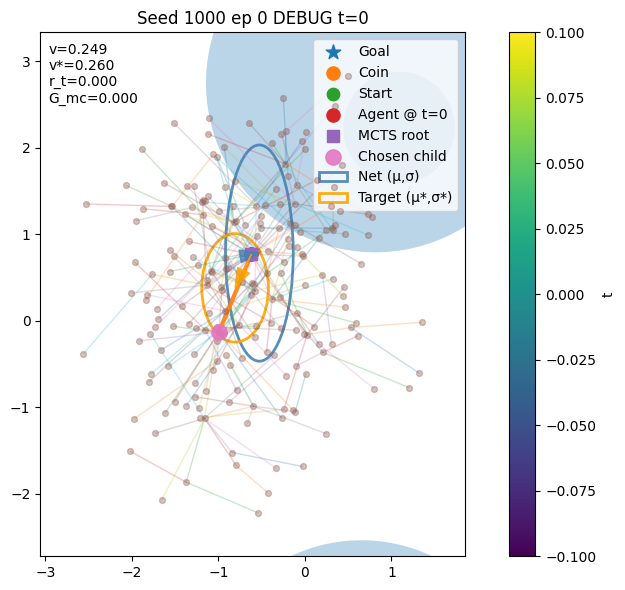

network: (array([0.09245209, 0.01568193, 0.2853384 ], dtype=float32), array([-0.9380088 ,  0.22304697,  0.140055  ], dtype=float32), 0.24875402450561523)
target: (array([-0.18840325, -0.38629198, -0.59808856], dtype=float32), array([-0.9540411 , -0.4666187 , -0.78633165], dtype=float32), 0.2604073422709308)


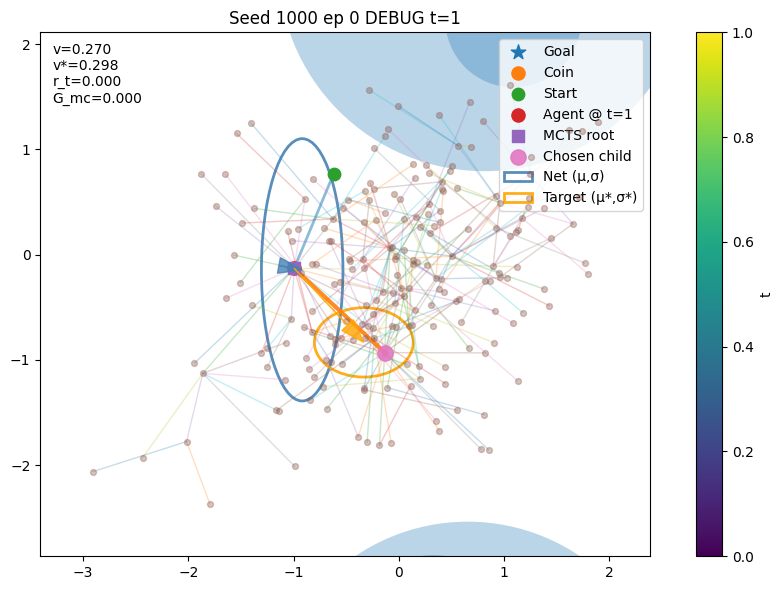

network: (array([ 0.07614988, -0.01418898,  0.2845084 ], dtype=float32), array([-0.9488896 ,  0.2195913 ,  0.11789455], dtype=float32), 0.27002978324890137)
target: (array([ 0.66152525, -0.7031936 , -0.6397969 ], dtype=float32), array([-0.7554469, -1.1101289, -1.0456117], dtype=float32), 0.2975152265407481)


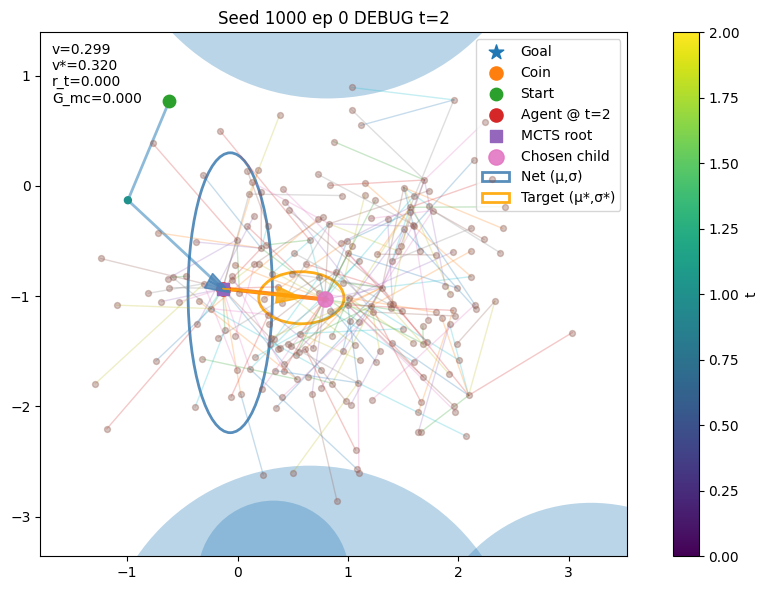

network: (array([ 0.068481  , -0.03813423,  0.2828583 ], dtype=float32), array([-0.9609406 ,  0.23777603,  0.1037145 ], dtype=float32), 0.29879024624824524)
target: (array([ 0.7127028 , -0.08354671, -0.546454  ], dtype=float32), array([-0.9514809, -1.4450701, -0.9953853], dtype=float32), 0.3199448629270813)


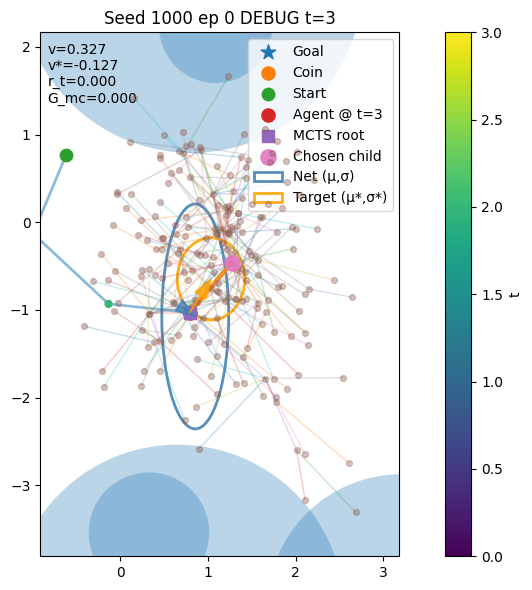

network: (array([ 0.06441189, -0.04394741,  0.27430332], dtype=float32), array([-0.9637644 ,  0.2490439 ,  0.09106094], dtype=float32), 0.32695144414901733)
target: (array([ 0.24527274,  0.38395062, -0.25066054], dtype=float32), array([-0.9535716, -0.7591611, -0.6737213], dtype=float32), -0.12656053079348298)


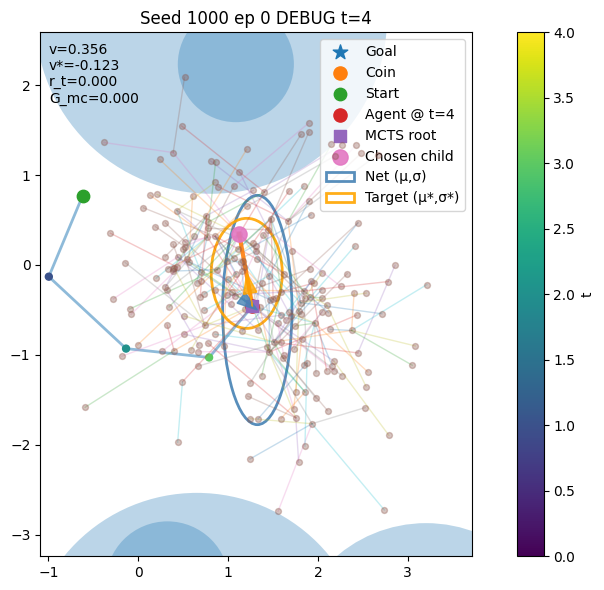

network: (array([ 0.05447442, -0.04114294,  0.25879616], dtype=float32), array([-0.9515104 ,  0.24373664,  0.06792297], dtype=float32), 0.35586804151535034)
target: (array([-0.06307002,  0.36655268, -0.20532206], dtype=float32), array([-0.92772096, -0.49051496, -0.48870942], dtype=float32), -0.12334845346804371)


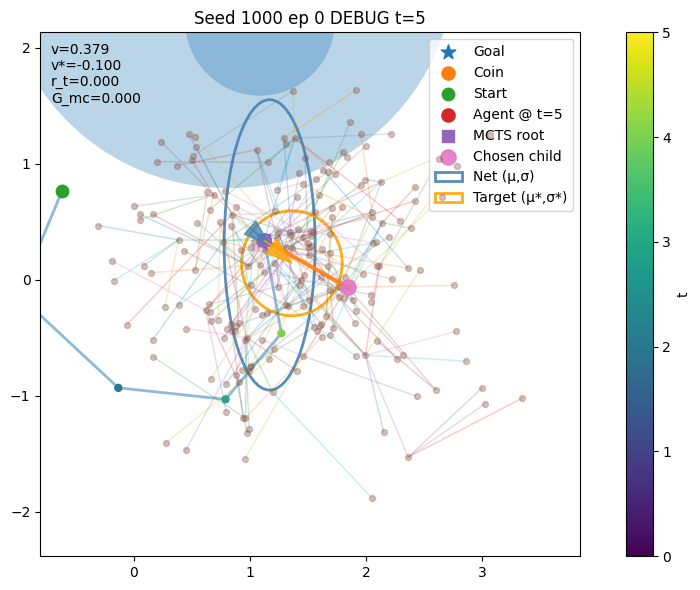

network: (array([ 0.04537636, -0.04002886,  0.24217151], dtype=float32), array([-0.9356177 ,  0.2248206 ,  0.04097398], dtype=float32), 0.3794838488101959)
target: (array([ 0.23688771, -0.19819959, -0.11818171], dtype=float32), array([-0.83485806, -0.7920818 , -0.6946711 ], dtype=float32), -0.09954590354224654)


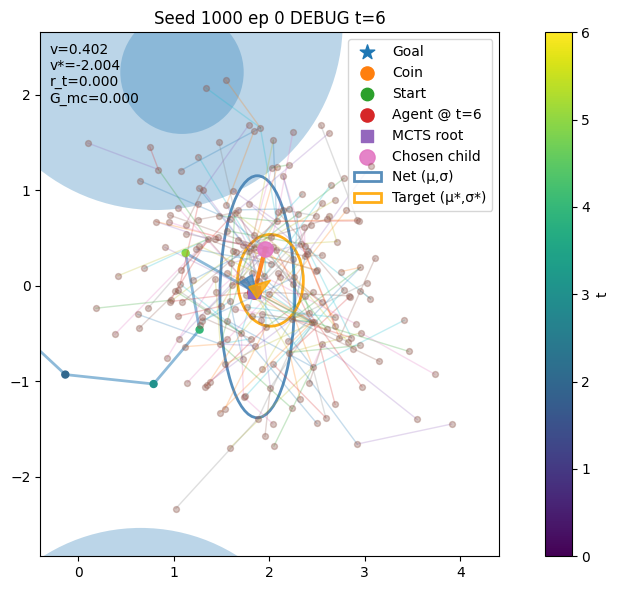

network: (array([ 0.03230653, -0.05254747,  0.24063143], dtype=float32), array([-0.93861806,  0.23651116,  0.03456663], dtype=float32), 0.4016004204750061)
target: (array([ 0.17043443,  0.11947811, -0.03668572], dtype=float32), array([-1.0677344 , -0.7333636 , -0.45517898], dtype=float32), -2.003908699557298)


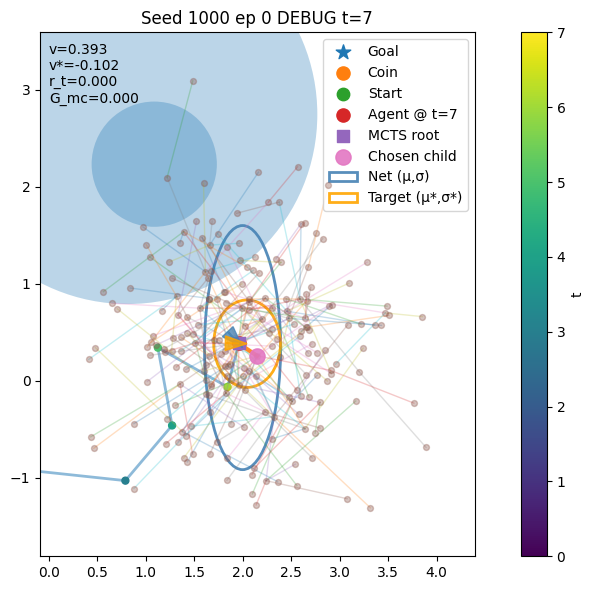

network: (array([ 0.03931927, -0.04230401,  0.24464816], dtype=float32), array([-0.934474  ,  0.23019944,  0.03573073], dtype=float32), 0.3932352662086487)
target: (array([ 0.08596051, -0.00197589, -0.02205478], dtype=float32), array([-1.066441 , -0.796788 , -0.7581277], dtype=float32), -0.1018238524244571)


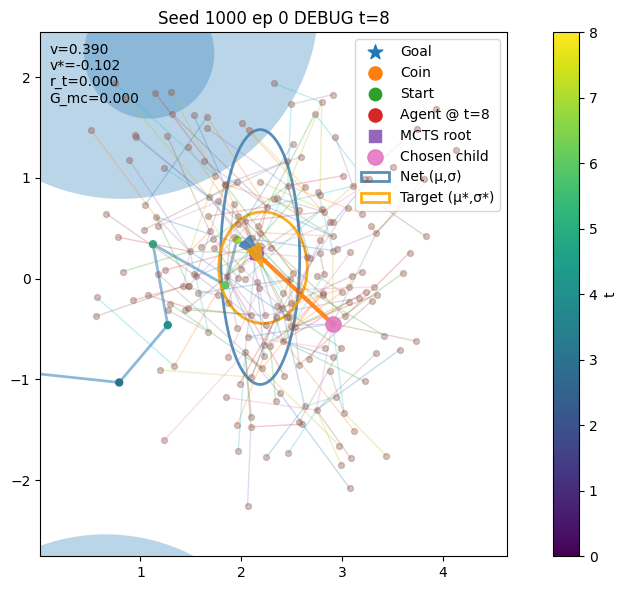

network: (array([ 0.04042296, -0.04247101,  0.24893557], dtype=float32), array([-0.93722713,  0.23458739,  0.04074406], dtype=float32), 0.3900441825389862)
target: (array([ 0.06810441, -0.14774673, -0.21470374], dtype=float32), array([-0.82353556, -0.59219855, -0.68460923], dtype=float32), -0.1017933105712246)


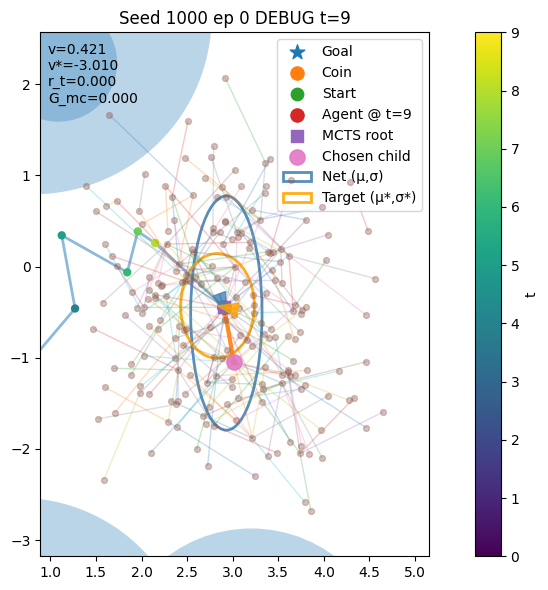

network: (array([ 0.02365368, -0.06393128,  0.24347197], dtype=float32), array([-0.93782103,  0.25037706,  0.03639261], dtype=float32), 0.4205075800418854)
target: (array([-0.07375512,  0.01459858,  0.21510248], dtype=float32), array([-0.90507406, -0.55372864, -0.6823344 ], dtype=float32), -3.009653629683311)


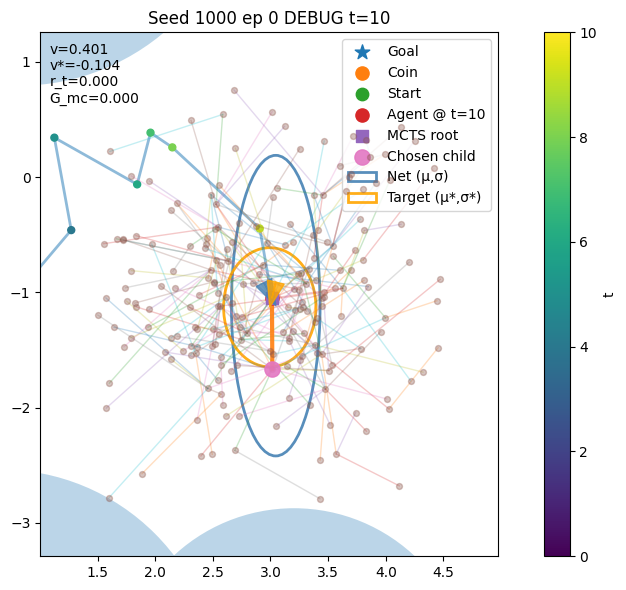

network: (array([ 0.03303054, -0.06470799,  0.26059043], dtype=float32), array([-0.95586455,  0.26540816,  0.05924293], dtype=float32), 0.4014013707637787)
target: (array([-0.01907527, -0.07902733,  0.2078141 ], dtype=float32), array([-0.91505253, -0.6598254 , -0.8196782 ], dtype=float32), -0.10420431731174826)


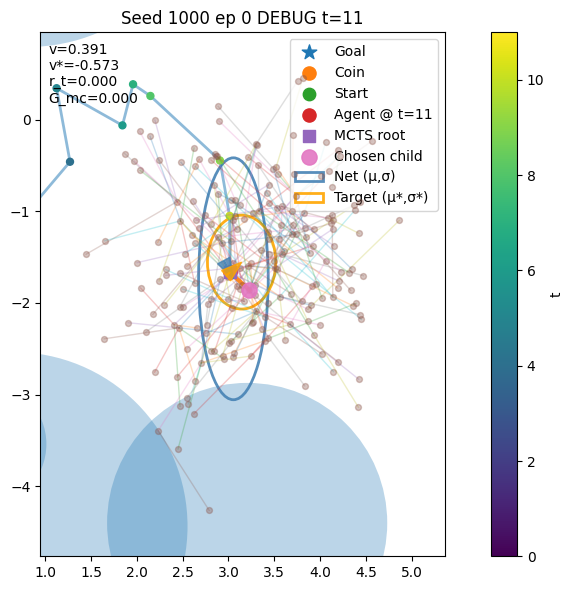

network: (array([ 0.03771261, -0.07068092,  0.26907134], dtype=float32), array([-0.9677353 ,  0.2773487 ,  0.07469786], dtype=float32), 0.39138972759246826)
target: (array([0.12726937, 0.11101221, 0.13931452], dtype=float32), array([-0.9869068 , -0.66939247, -0.6172766 ], dtype=float32), -0.573093062177804)


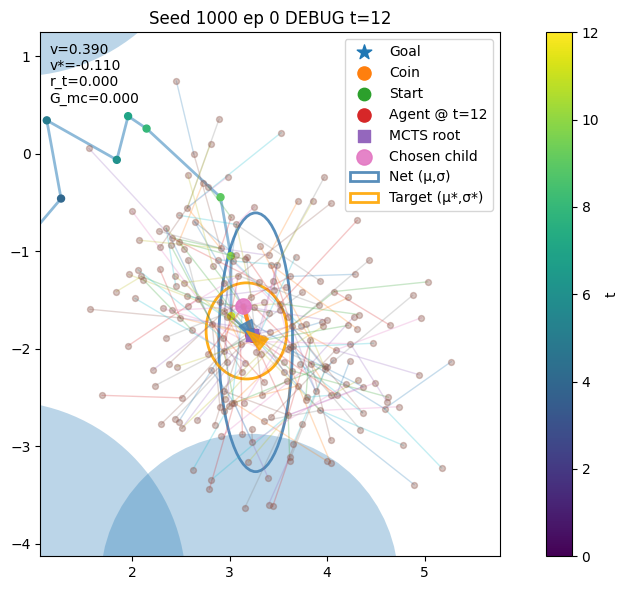

network: (array([ 0.03828034, -0.07248268,  0.27334112], dtype=float32), array([-0.9715425 ,  0.28302544,  0.08001014], dtype=float32), 0.39026206731796265)
target: (array([-0.05594999,  0.04378548,  0.20055705], dtype=float32), array([-0.8812312, -0.7071722, -0.5679522], dtype=float32), -0.10957083484026856)


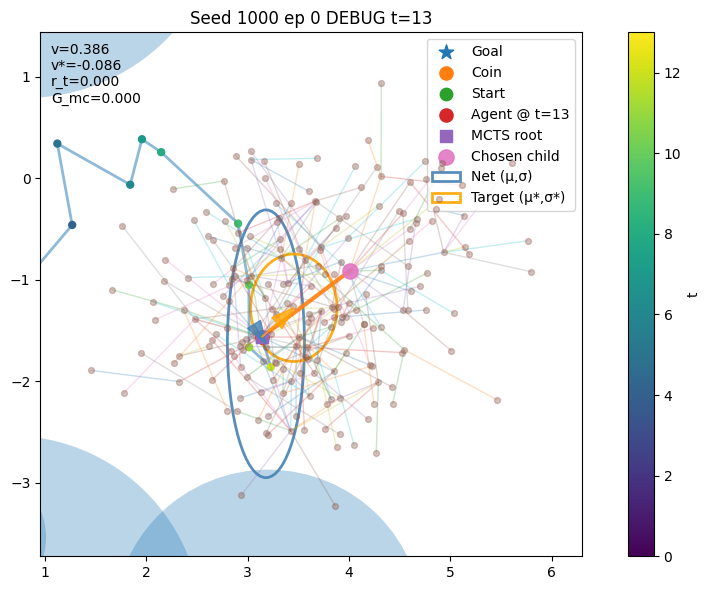

network: (array([ 0.04079119, -0.06646803,  0.27287942], dtype=float32), array([-0.9678228 ,  0.277398  ,  0.07775838], dtype=float32), 0.3861237168312073)
target: (array([ 0.31549   ,  0.28852135, -0.19143513], dtype=float32), array([-0.85303336, -0.6352881 , -0.62884235], dtype=float32), -0.08613435594258739)


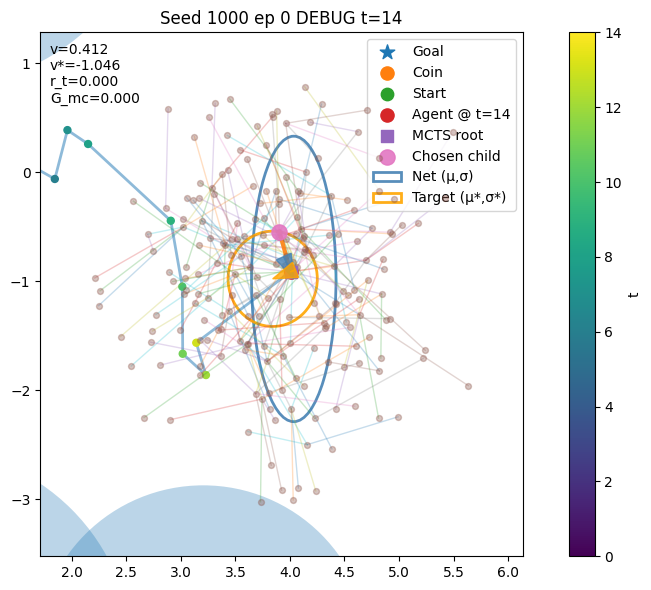

network: (array([ 0.02931247, -0.06537449,  0.26309943], dtype=float32), array([-0.9482211 ,  0.2693147 ,  0.05788118], dtype=float32), 0.4116906225681305)
target: (array([-0.16394173, -0.06434414, -0.03925448], dtype=float32), array([-0.8937245, -0.8278148, -0.4509004], dtype=float32), -1.045550093010253)


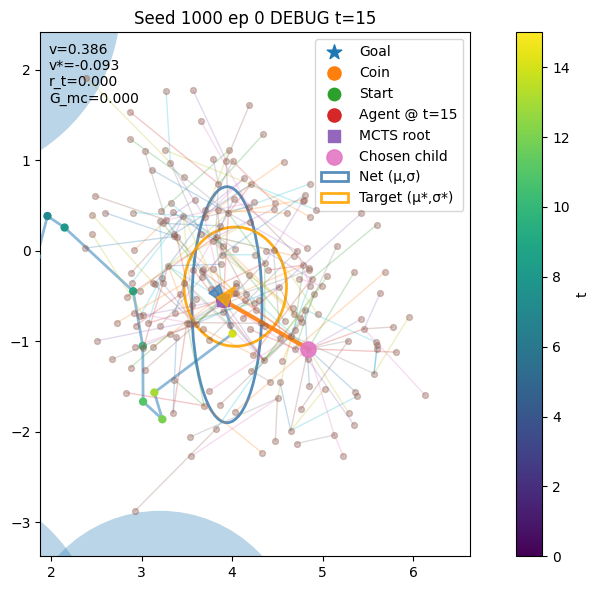

network: (array([ 0.0400487 , -0.0491543 ,  0.27173907], dtype=float32), array([-0.9468906 ,  0.2655627 ,  0.07121059], dtype=float32), 0.3855849802494049)
target: (array([ 0.13225083,  0.15051897, -0.02092831], dtype=float32), array([-0.5688184 , -0.41714263, -0.5911085 ], dtype=float32), -0.09305366836904094)


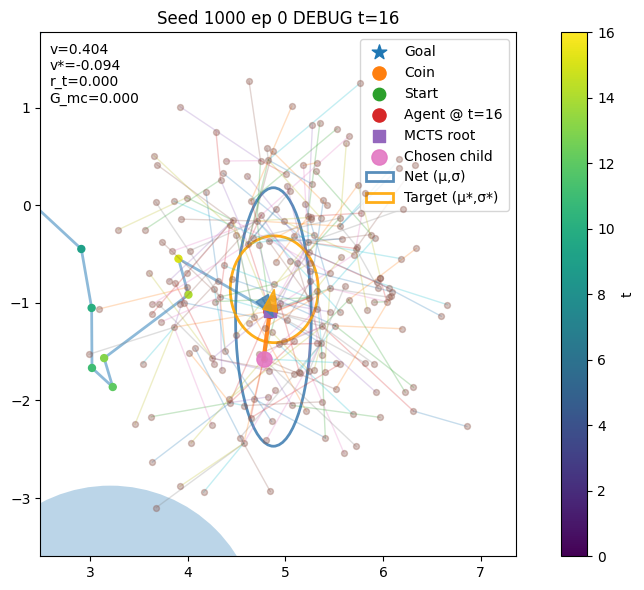

network: (array([ 0.03607656, -0.06019251,  0.2776701 ], dtype=float32), array([-0.9468881 ,  0.2815495 ,  0.07331441], dtype=float32), 0.4044753909111023)
target: (array([ 0.04484801,  0.22412607, -0.06958161], dtype=float32), array([-0.79635316, -0.6020992 , -0.9210495 ], dtype=float32), -0.09449749986186817)


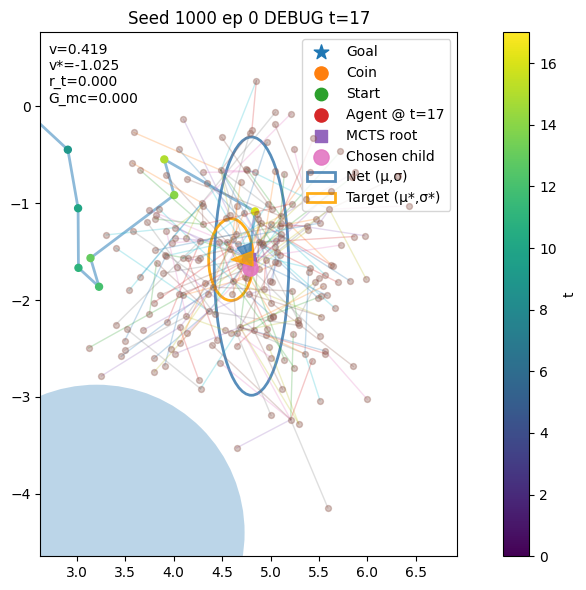

network: (array([ 0.02700214, -0.07555605,  0.27188152], dtype=float32), array([-0.9559448 ,  0.28795648,  0.06935293], dtype=float32), 0.4194844961166382)
target: (array([-0.1842679 , -0.00831332,  0.06929755], dtype=float32), array([-1.4665006 , -0.8611028 , -0.45348492], dtype=float32), -1.0251635825865864)


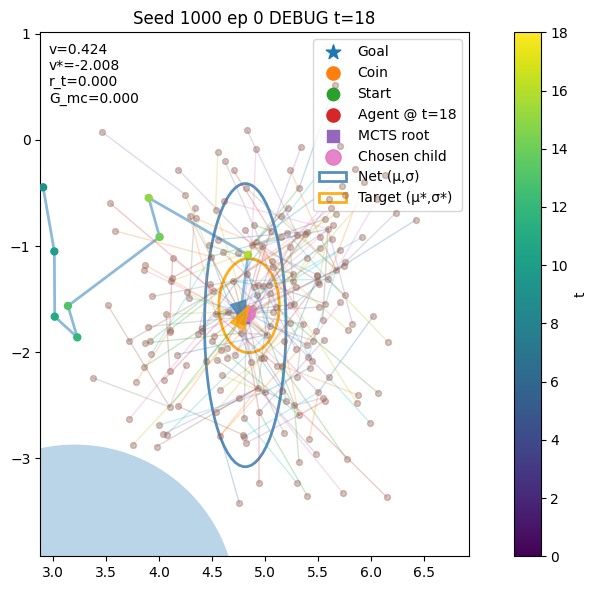

network: (array([ 0.02454456, -0.07895547,  0.27048707], dtype=float32), array([-0.95644295,  0.28931236,  0.06793272], dtype=float32), 0.4236385226249695)
target: (array([ 0.06066998,  0.10558732, -0.00222387], dtype=float32), array([-1.2551783 , -0.81062615, -0.5290909 ], dtype=float32), -2.008041568330879)


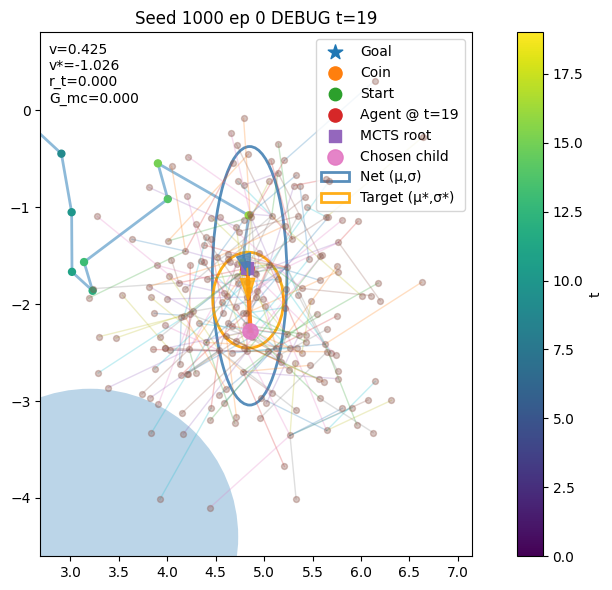

network: (array([ 0.02351328, -0.07929537,  0.26943678], dtype=float32), array([-0.9549953 ,  0.28853863,  0.06626578], dtype=float32), 0.42545968294143677)
target: (array([ 0.00771891, -0.33099777, -0.15422642], dtype=float32), array([-1.0084673, -0.7029087, -0.5845526], dtype=float32), -1.0258795126440812)


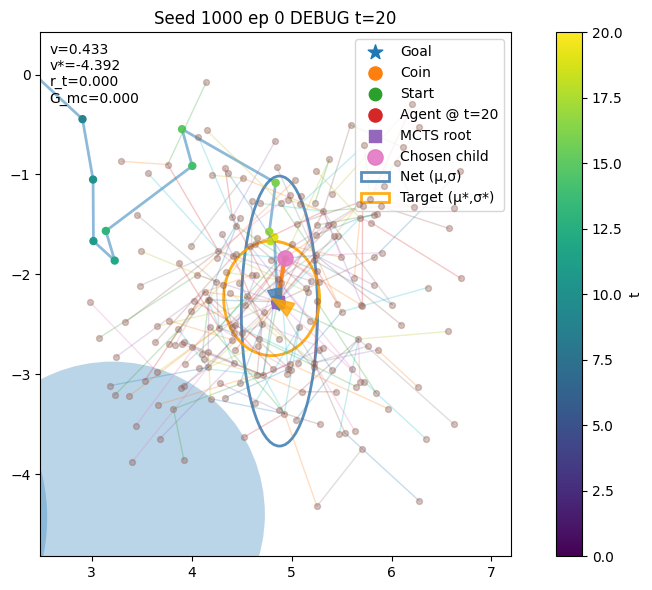

network: (array([ 0.019171  , -0.09213066,  0.27072734], dtype=float32), array([-0.9637928 ,  0.30084062,  0.07040433], dtype=float32), 0.43285802006721497)
target: (array([-0.0593753 ,  0.03570329,  0.11762433], dtype=float32), array([-0.73385113, -0.5555074 , -0.57919645], dtype=float32), -4.392175755331675)


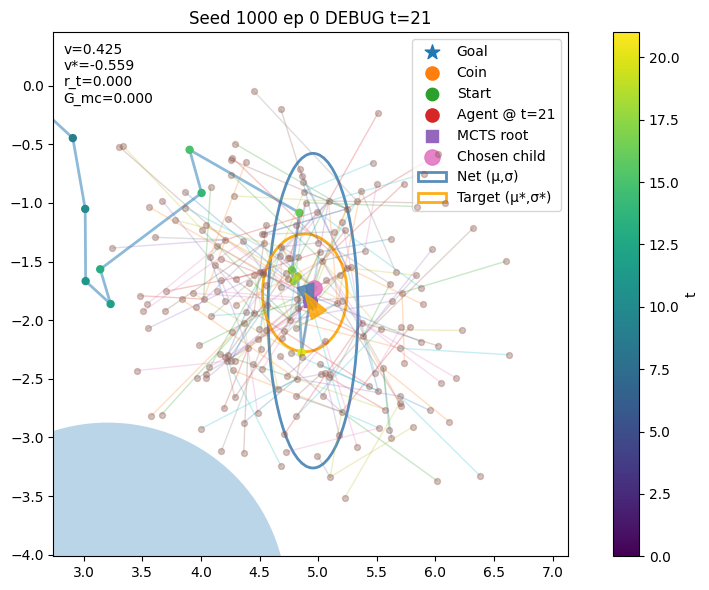

network: (array([ 0.02442378, -0.08149822,  0.2731191 ], dtype=float32), array([-0.9586761 ,  0.29399496,  0.07071159], dtype=float32), 0.42485618591308594)
target: (array([-0.04529488,  0.07084984,  0.11165228], dtype=float32), array([-1.0201358 , -0.6890618 , -0.70365816], dtype=float32), -0.5593082723892978)


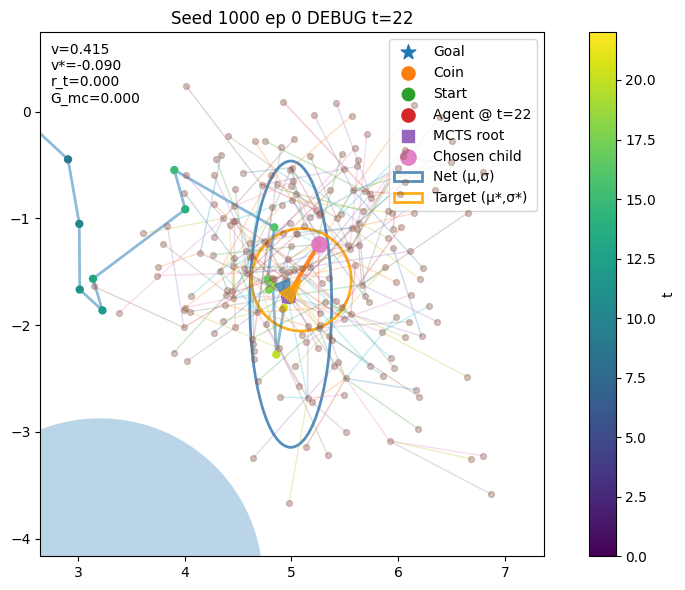

network: (array([ 0.02948298, -0.07536989,  0.27730656], dtype=float32), array([-0.9581641 ,  0.2937888 ,  0.07654158], dtype=float32), 0.41547518968582153)
target: (array([0.12874041, 0.15310545, 0.33167973], dtype=float32), array([-0.760078  , -0.73398507, -0.76970136], dtype=float32), -0.09047328826532369)


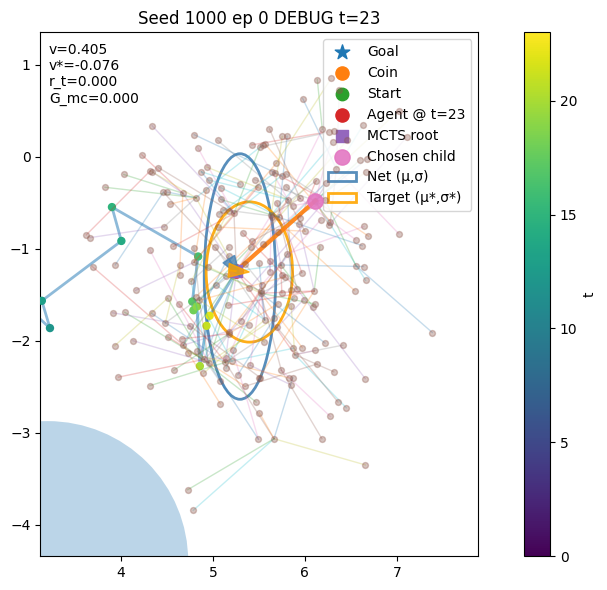

network: (array([ 0.03900262, -0.06051802,  0.28666532], dtype=float32), array([-0.9445703 ,  0.28871542,  0.07662117], dtype=float32), 0.4050043821334839)
target: (array([ 0.14076228, -0.01145223, -0.05256521], dtype=float32), array([-0.7558891 , -0.27132422, -0.6147055 ], dtype=float32), -0.07608778557041834)


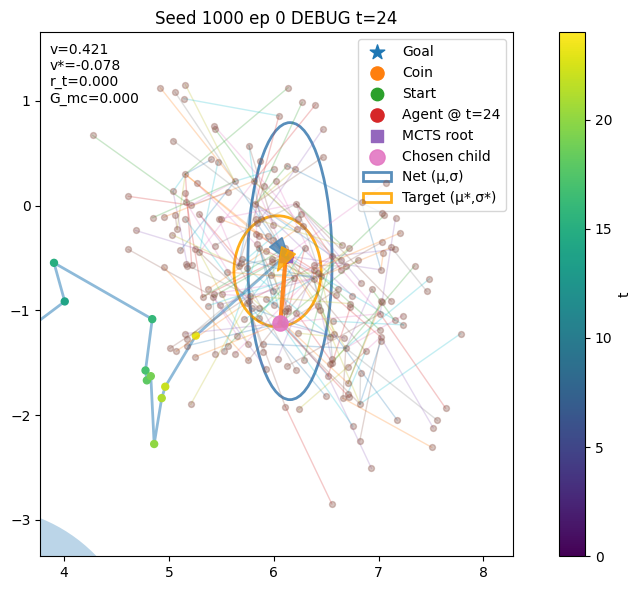

network: (array([ 0.04002541, -0.05311258,  0.2909209 ], dtype=float32), array([-0.9120474 ,  0.27894038,  0.05263618], dtype=float32), 0.42095500230789185)
target: (array([-0.07904192, -0.14981268,  0.04714197], dtype=float32), array([-0.87747115, -0.6363348 , -0.670827  ], dtype=float32), -0.07824258726699528)


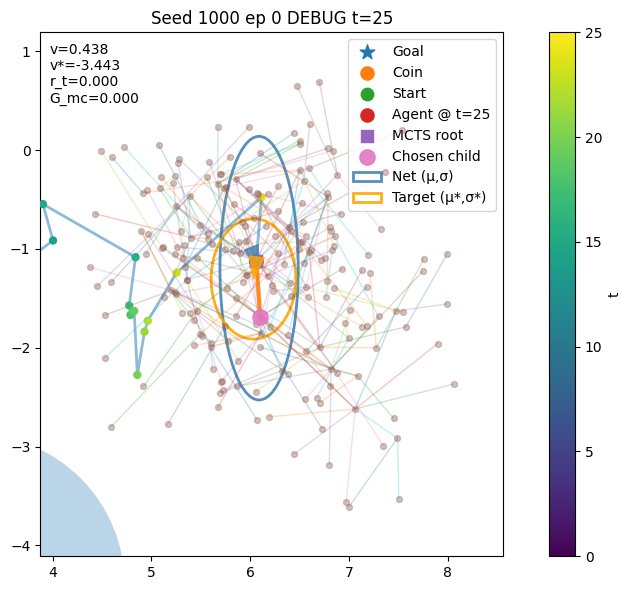

network: (array([ 0.02824358, -0.07364915,  0.28253216], dtype=float32), array([-0.92599475,  0.28810853,  0.05144893], dtype=float32), 0.4383097290992737)
target: (array([-0.02828589, -0.18205145,  0.08351656], dtype=float32), array([-0.8469293, -0.4953263, -0.6863201], dtype=float32), -3.4426180657412133)


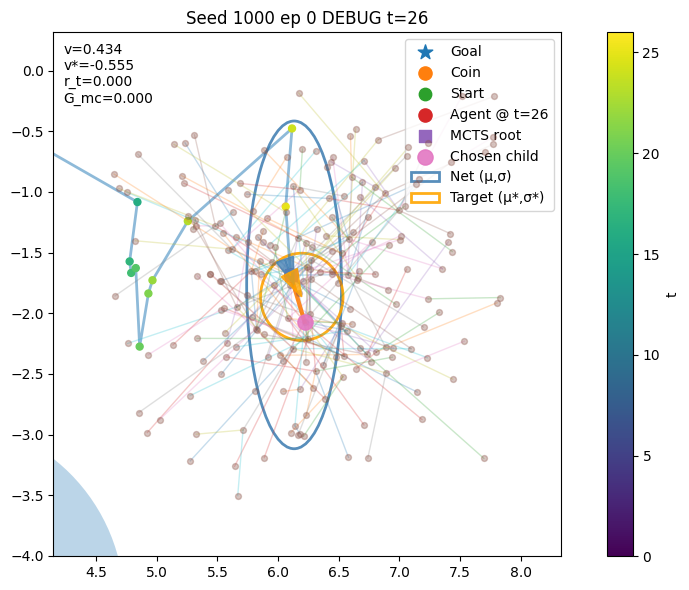

network: (array([ 0.02883476, -0.07970032,  0.28829533], dtype=float32), array([-0.9389914 ,  0.30069655,  0.0647951 ], dtype=float32), 0.4342336356639862)
target: (array([ 0.09206288, -0.17842911,  0.06146514], dtype=float32), array([-1.0787592 , -1.0222001 , -0.66710144], dtype=float32), -0.5546888200289004)


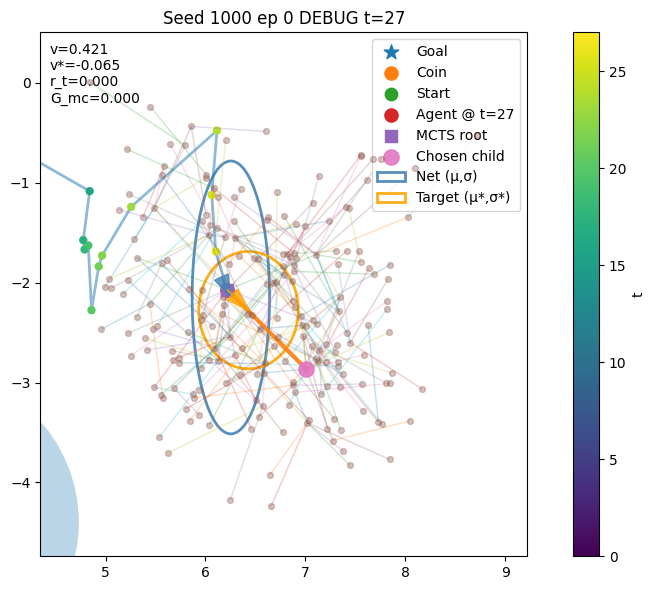

network: (array([ 0.03568099, -0.07732401,  0.30023748], dtype=float32), array([-0.94792163,  0.3119567 ,  0.08153532], dtype=float32), 0.421328604221344)
target: (array([ 0.21290375, -0.20445499,  0.14987402], dtype=float32), array([-0.6973498 , -0.5318955 , -0.61485606], dtype=float32), -0.06503419354588777)


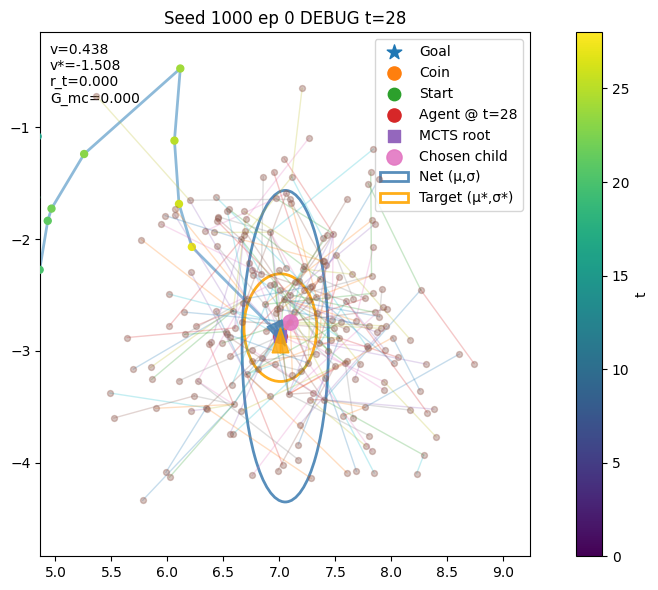

network: (array([ 0.04286836, -0.09155885,  0.3133574 ], dtype=float32), array([-0.9524766 ,  0.33038306,  0.08311973], dtype=float32), 0.43843260407447815)
target: (array([-0.00030842,  0.07390264,  0.10074597], dtype=float32), array([-1.1231227 , -0.7325927 , -0.50274146], dtype=float32), -1.5079475835579947)


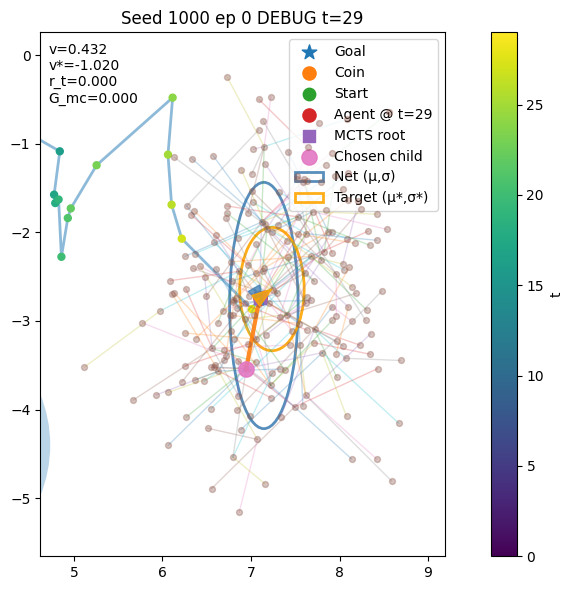

network: (array([ 0.04851496, -0.08465852,  0.3177179 ], dtype=float32), array([-0.94889843,  0.32998425,  0.08624845], dtype=float32), 0.4316185414791107)
target: (array([ 0.13947862,  0.10143532, -0.04552182], dtype=float32), array([-1.0099099 , -0.36122864, -0.56223166], dtype=float32), -1.0196947935479113)


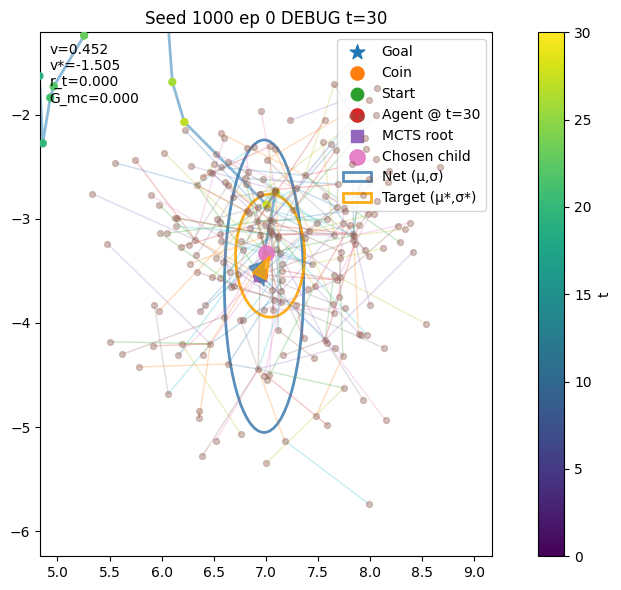

network: (array([ 0.03812016, -0.10920876,  0.30758846], dtype=float32), array([-0.96641076,  0.339639  ,  0.08304531], dtype=float32), 0.4518764317035675)
target: (array([0.0960555 , 0.18417528, 0.5010646 ], dtype=float32), array([-1.1041912 , -0.5265054 , -0.89351326], dtype=float32), -1.5048046721212769)


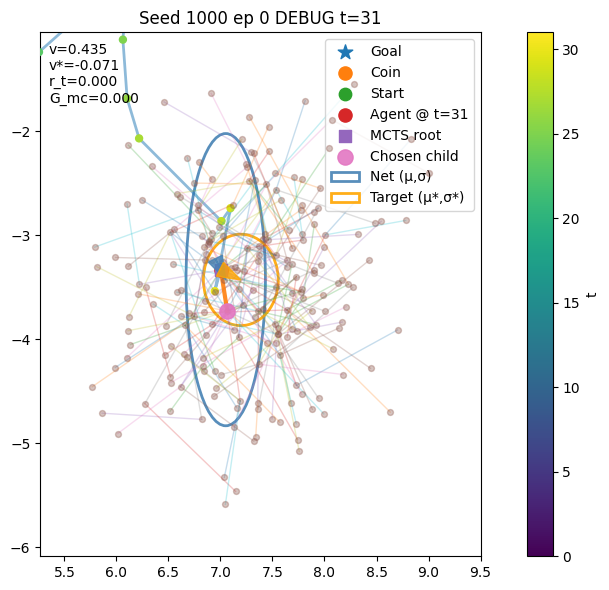

network: (array([ 0.04741414, -0.09561418,  0.31854075], dtype=float32), array([-0.96362007,  0.33950967,  0.09326618], dtype=float32), 0.43525266647338867)
target: (array([ 0.19256543, -0.09800879,  0.3319267 ], dtype=float32), array([-1.0220549, -0.8231595, -0.6006458], dtype=float32), -0.07082273213832908)


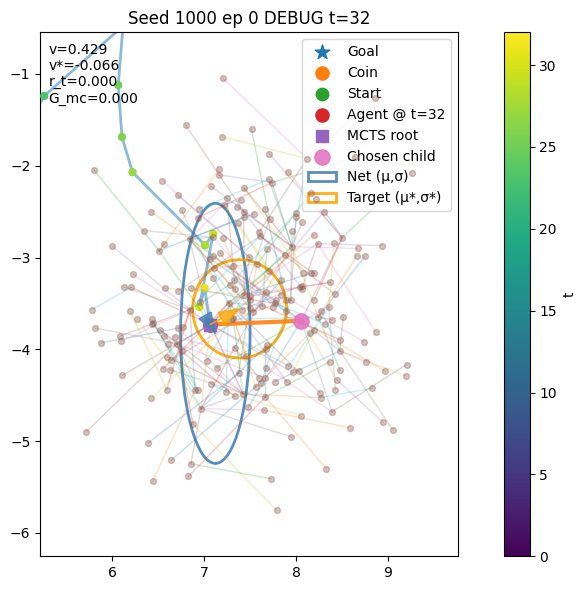

network: (array([ 0.05491385, -0.09620601,  0.326429  ], dtype=float32), array([-0.97248733,  0.34843338,  0.10458741], dtype=float32), 0.42900946736335754)
target: (array([ 0.31944418,  0.17068787, -0.03644627], dtype=float32), array([-0.6698518 , -0.6244754 , -0.55383617], dtype=float32), -0.0655328056608334)


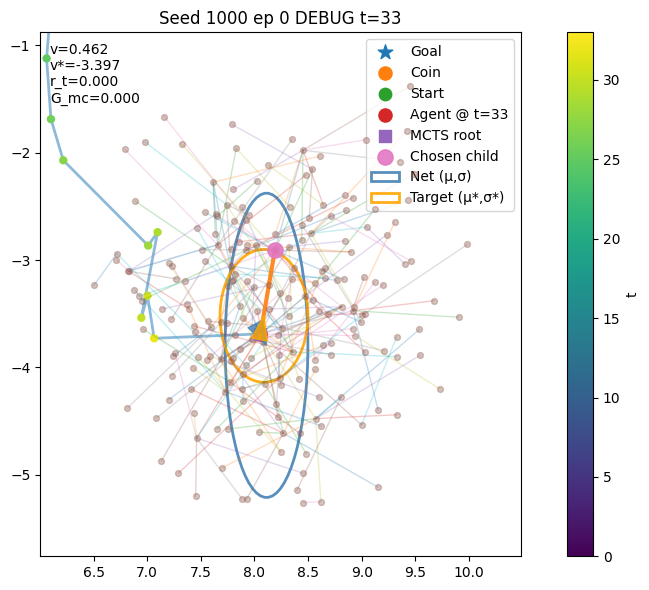

network: (array([ 0.05623158, -0.10651048,  0.3292656 ], dtype=float32), array([-0.9526895 ,  0.34924394,  0.07952357], dtype=float32), 0.4623408913612366)
target: (array([0.03269638, 0.16796845, 0.02133069], dtype=float32), array([-0.8924169 , -0.4795359 , -0.86529195], dtype=float32), -3.397236404321756)


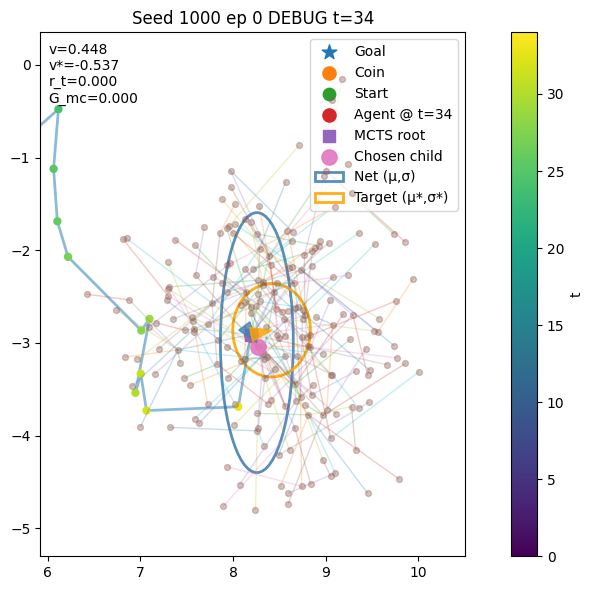

network: (array([ 0.06570973, -0.08712928,  0.3271687 ], dtype=float32), array([-0.93337905,  0.33844483,  0.07679983], dtype=float32), 0.4483288526535034)
target: (array([0.22471869, 0.04580881, 0.25584626], dtype=float32), array([-0.869784 , -0.6855696, -0.583139 ], dtype=float32), -0.5368690485810295)


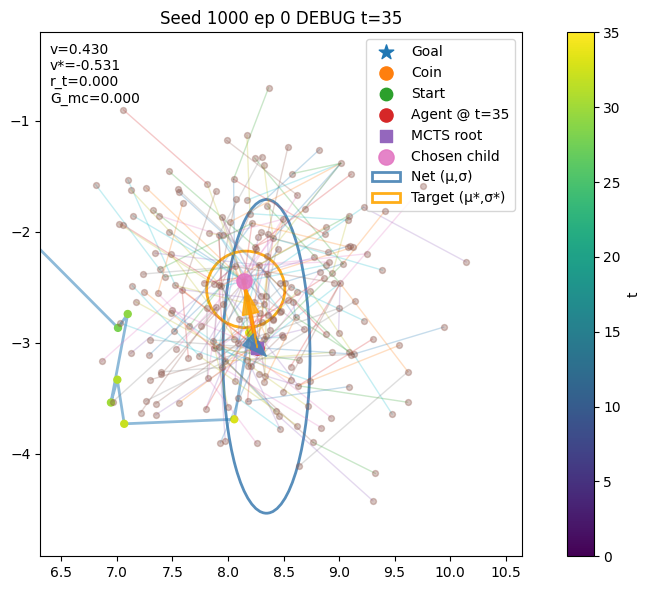

network: (array([ 0.08308828, -0.07842512,  0.33275884], dtype=float32), array([-0.9357352 ,  0.3455009 ,  0.09127077], dtype=float32), 0.43001484870910645)
target: (array([-0.10355037,  0.52460015, -0.19152619], dtype=float32), array([-1.0442314 , -1.0644667 , -0.79196614], dtype=float32), -0.5311221088584306)


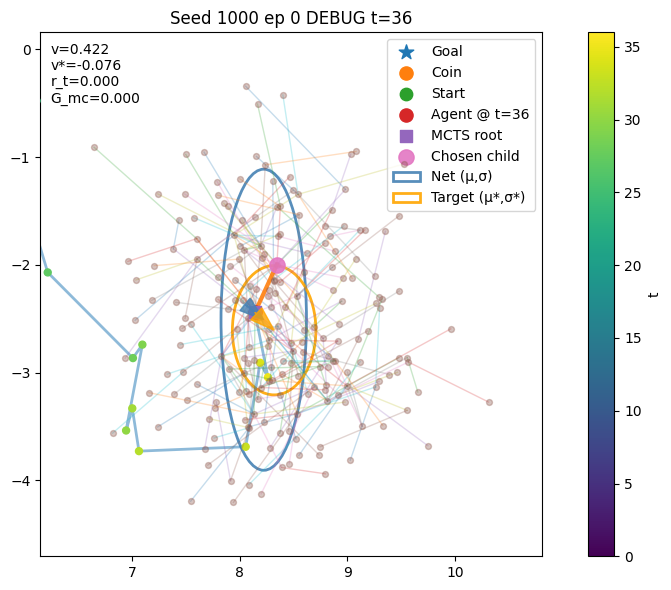

network: (array([ 0.08190736, -0.06740538,  0.32766914], dtype=float32), array([-0.92435837,  0.33489847,  0.08700848], dtype=float32), 0.42189815640449524)
target: (array([ 0.17843147, -0.16480726,  0.05457442], dtype=float32), array([-0.94747216, -0.51035815, -0.8418722 ], dtype=float32), -0.07615658316195381)


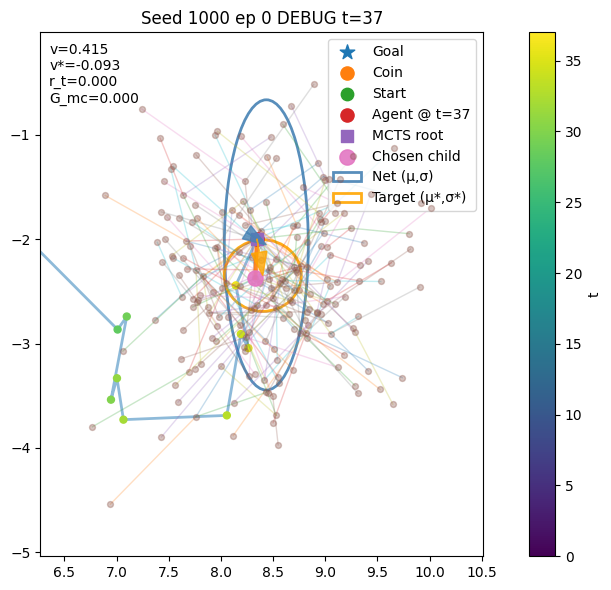

network: (array([ 0.0892273 , -0.05754004,  0.3264252 ], dtype=float32), array([-0.90984786,  0.33024865,  0.08297554], dtype=float32), 0.41540464758872986)
target: (array([ 0.05537098, -0.35126877,  0.11012532], dtype=float32), array([-0.9968551 , -1.0700195 , -0.99481356], dtype=float32), -0.09328485632462784)


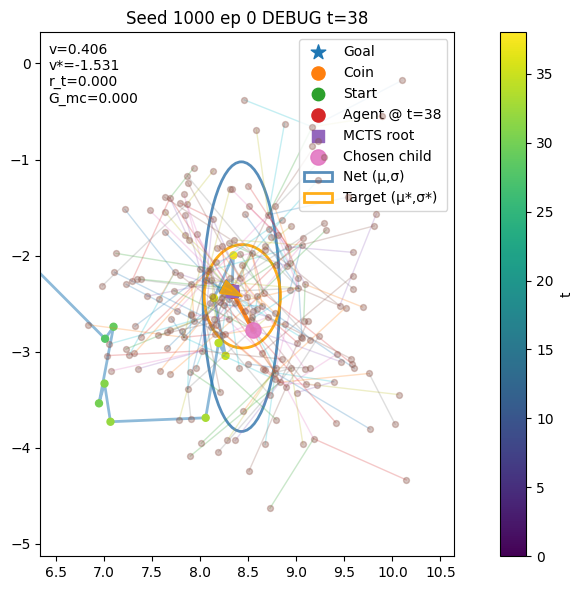

network: (array([ 0.09804948, -0.05686562,  0.3318835 ], dtype=float32), array([-0.91896415,  0.33894914,  0.09577876], dtype=float32), 0.40607738494873047)
target: (array([ 0.10854192, -0.05309039, -0.08670518], dtype=float32), array([-0.92441416, -0.61875594, -0.44912836], dtype=float32), -1.5313522895299732)


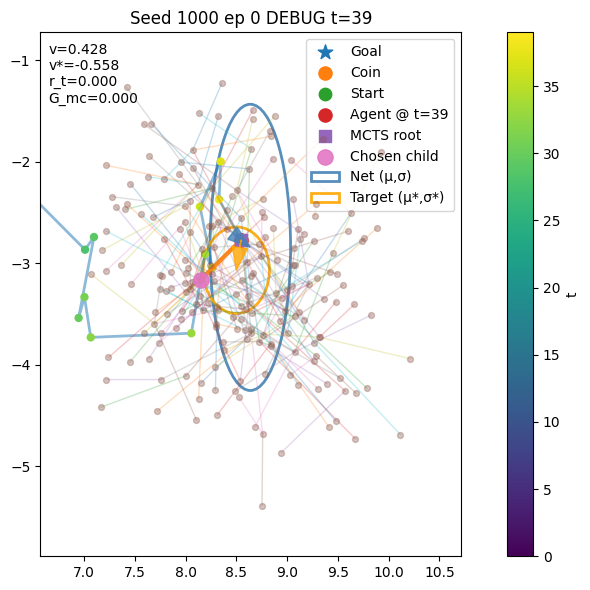

network: (array([ 0.09161767, -0.07307538,  0.33256865], dtype=float32), array([-0.924175  ,  0.3436787 ,  0.08662368], dtype=float32), 0.42823848128318787)
target: (array([-0.04608546, -0.29825178, -0.11941809], dtype=float32), array([-1.120135 , -0.8523646, -0.5010961], dtype=float32), -0.5575003164121777)


In [24]:
n = len(traces[seed]["roots"])

for i in range(min(n, 40)):
    fig, ax = plt.subplots(1, 1, figsize=(12, 6), sharex=True, sharey=True)
    plot_dbg_step(
        traces[seed],
        i,
        num_obstacles=env_config.num_obstacles,
        ax=ax,
        max_depth=99,
        top_k_per_node=99,
        title=f"Seed {seed} ep {train_iter} DEBUG t={i}"
    )
    plt.tight_layout()
    plt.show()
    print("network:", traces[seed]["network_outputs"][i])
    print("target:", traces[seed]["targets_from_root"][i])